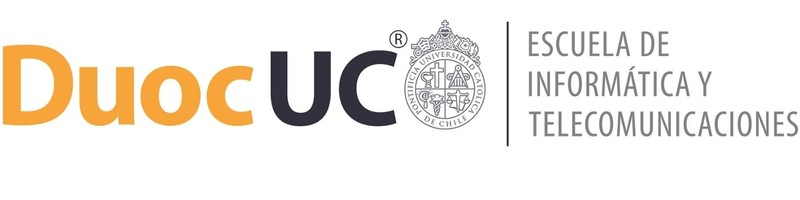

# **Informe Notebook** Proyecto: Cerveceria casera en el mercado chileno

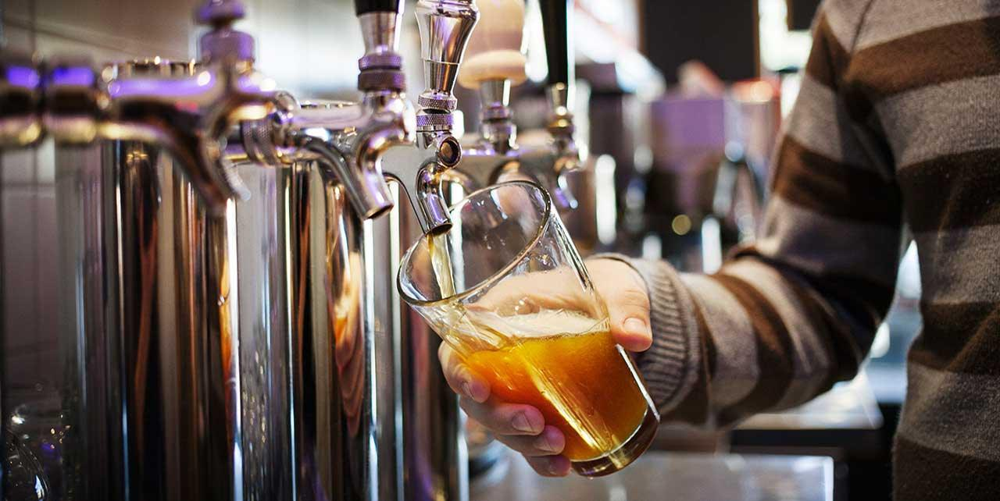

# Contexto del caso:


**En el rubro de la creación de cervezas cada vez es más conocido el tema de las cervezas casera, estas durante estos últimos años han aumentado en popularidad debido a lo innovador de sus sabores, por eso cerveceras grandes de renombre como Kross quieren tener una parte de ese negocio haciendo ellos sus propios sabores innovadores, para ello la empresa Kross nos pidió a nosotros como grupo DJJ que analicemos un csv con muestras de cervezas caseras estadounidenses para que veamos cuales fueron las mejores valoradas para integrarlas en el mercado chileno.**

## Fase 1: Comprender Negocio

**Nuestro objetivo como grupo es analizar los datos de las cervezas estadounidenses para poder ver cuáles fueron las mejores calificadas, para esto ocuparemos diferentes métodos y gráficos para sacar en claro todo los datos necesarios.**



además de responder las siguientes preguntas

¿Cuáles son los tipos de cerveza mejor evaluados?

¿Cuáles son las cervezas con mejor sabor valorado?

¿Cuál de las cervezas tiene más reviews dentro de los datos?



# Importar librerias y el CSV

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

In [ ]:
!pip install openpyxl
import pandas as pd

#
# Leer el archivo csv
#
df = pd.read_csv("sample_data/beer_reviews.csv")

# Fase 2: Comprender los datos del CSV

Ahora que tenemos el csv cargado veremos la cantidad de datos y columnas además de analizar los datos que más se nos hagan útiles para el proyecto

In [ ]:
df

,brewery_id,brewery_name,review_time,review_overall,review_aroma,review_appearance,review_profilename,beer_style,review_palate,review_taste,beer_name,beer_abv,beer_beerid
0,10325,Vecchio Birraio,1234817823,1.5,2.0,2.5,stcules,Hefeweizen,1.5,1.5,Sausa Weizen,5.0,47986
1,10325,Vecchio Birraio,1235915097,3.0,2.5,3.0,stcules,English Strong Ale,3.0,3.0,Red Moon,6.2,48213
2,10325,Vecchio Birraio,1235916604,3.0,2.5,3.0,stcules,Foreign / Export Stout,3.0,3.0,Black Horse Black Beer,6.5,48215
3,10325,Vecchio Birraio,1234725145,3.0,3.0,3.5,stcules,German Pilsener,2.5,3.0,Sausa Pils,5.0,47969
4,1075,Caldera Brewing Company,1293735206,4.0,4.5,4.0,johnmichaelsen,American Double / Imperial IPA,4.0,4.5,Cauldron DIPA,7.7,64883
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1586609,14359,The Defiant Brewing Company,1162684892,5.0,4.0,3.5,maddogruss,Pumpkin Ale,4.0,4.0,The Horseman's Ale,5.2,33061
1586610,14359,The Defiant Brewing Company,1161048566,4.0,5.0,2.5,yelterdow,Pumpkin Ale,2.0,4.0,The Horseman's Ale,5.2,33061
1586611,14359,The Defiant Brewing Company,1160702513,4.5,3.5,3.0,TongoRad,Pumpkin Ale,3.5,4.0,The Horseman's Ale,5.2,33061
1586612,14359,The Defiant Brewing Company,1160023044,4.0,4.5,4.5,dherling,Pumpkin Ale,4.5,4.5,The Horseman's Ale,5.2,33061


ver número de filas y columnas del csv

In [ ]:
df.shape

(1586614, 13)

ver columnas del csv

In [ ]:
df.columns

Index(['brewery_id', 'brewery_name', 'review_time', 'review_overall',
       'review_aroma', 'review_appearance', 'review_profilename', 'beer_style',
       'review_palate', 'review_taste', 'beer_name', 'beer_abv',
       'beer_beerid'],
      dtype='object')

Resumen de los datos del csv

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1586614 entries, 0 to 1586613
Data columns (total 13 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   brewery_id          1586614 non-null  int64  
 1   brewery_name        1586599 non-null  object 
 2   review_time         1586614 non-null  int64  
 3   review_overall      1586614 non-null  float64
 4   review_aroma        1586614 non-null  float64
 5   review_appearance   1586614 non-null  float64
 6   review_profilename  1586266 non-null  object 
 7   beer_style          1586614 non-null  object 
 8   review_palate       1586614 non-null  float64
 9   review_taste        1586614 non-null  float64
 10  beer_name           1586614 non-null  object 
 11  beer_abv            1518829 non-null  float64
 12  beer_beerid         1586614 non-null  int64  
dtypes: float64(6), int64(3), object(4)
memory usage: 157.4+ MB


Resumen estadistico de las columnas

In [ ]:
df.describe()

,brewery_id,review_time,review_overall,review_aroma,review_appearance,review_palate,review_taste,beer_abv,beer_beerid
count,1.586614e+06,1.586614e+06,1.586614e+06,1.586614e+06,1.586614e+06,1.586614e+06,1.586614e+06,1.518829e+06,1.586614e+06
mean,3.130099e+03,1.224089e+09,3.815581e+00,3.735636e+00,3.841642e+00,3.743701e+00,3.792860e+00,7.042387e+00,2.171279e+04
std,5.578104e+03,7.654427e+07,7.206219e-01,6.976167e-01,6.160928e-01,6.822184e-01,7.319696e-01,2.322526e+00,2.181834e+04
min,1.000000e+00,8.406720e+08,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e-02,3.000000e+00
25%,1.430000e+02,1.173224e+09,3.500000e+00,3.500000e+00,3.500000e+00,3.500000e+00,3.500000e+00,5.200000e+00,1.717000e+03
50%,4.290000e+02,1.239203e+09,4.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00,6.500000e+00,1.390600e+04
75%,2.372000e+03,1.288568e+09,4.500000e+00,4.000000e+00,4.000000e+00,4.000000e+00,4.500000e+00,8.500000e+00,3.944100e+04
max,2.800300e+04,1.326285e+09,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.770000e+01,7.731700e+04


#Ver los datos que nos resulten más interesantes

Nombre de la cerveceria

In [ ]:
df.brewery_name

,brewery_name
0,Vecchio Birraio
1,Vecchio Birraio
2,Vecchio Birraio
3,Vecchio Birraio
4,Caldera Brewing Company
...,...
1586609,The Defiant Brewing Company
1586610,The Defiant Brewing Company
1586611,The Defiant Brewing Company
1586612,The Defiant Brewing Company


nombre de las cervezas

In [ ]:
df.beer_name

,beer_name
0,Sausa Weizen
1,Red Moon
2,Black Horse Black Beer
3,Sausa Pils
4,Cauldron DIPA
...,...
1586609,The Horseman's Ale
1586610,The Horseman's Ale
1586611,The Horseman's Ale
1586612,The Horseman's Ale


regusto en el paladar

In [ ]:
df.review_palate

,review_palate
0,1.5
1,3.0
2,3.0
3,2.5
4,4.0
...,...
1586609,4.0
1586610,2.0
1586611,3.5
1586612,4.5


reseña general de la cerveza

In [ ]:
df.review_overall

,review_overall
0,1.5
1,3.0
2,3.0
3,3.0
4,4.0
...,...
1586609,5.0
1586610,4.0
1586611,4.5
1586612,4.0


gusto de la cerveza

In [ ]:
df.review_taste

,review_taste
0,1.5
1,3.0
2,3.0
3,3.0
4,4.5
...,...
1586609,4.0
1586610,4.0
1586611,4.0
1586612,4.5


apariencia de la cerveza

In [ ]:
df.review_appearance

,review_appearance
0,2.5
1,3.0
2,3.0
3,3.5
4,4.0
...,...
1586609,3.5
1586610,2.5
1586611,3.0
1586612,4.5


grados de alcohol en la cerveza

In [ ]:
df.beer_abv

,beer_abv
0,5.0
1,6.2
2,6.5
3,5.0
4,7.7
...,...
1586609,5.2
1586610,5.2
1586611,5.2
1586612,5.2


#Empezaremos con la graficación y análisis de los datos

En esta parte del proyecto nos encargamos de ver bien los datos que consideramos más factibles a tomar en este proyecto, en relación a las preguntas que planteamos en la parte 1.



<Axes: xlabel='review_overall', ylabel='Density'>

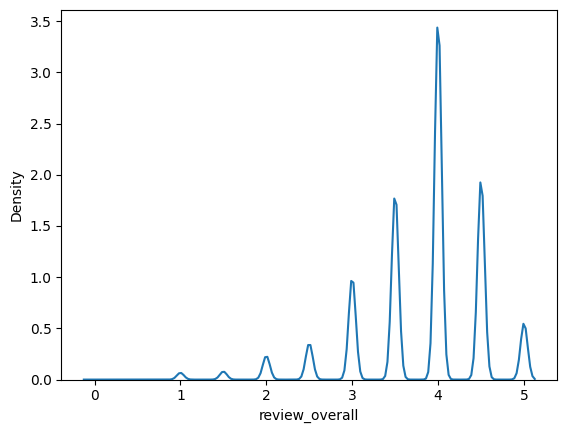

In [ ]:
from seaborn import kdeplot
kdeplot(df.review_overall)

<Axes: xlabel='review_taste', ylabel='Density'>

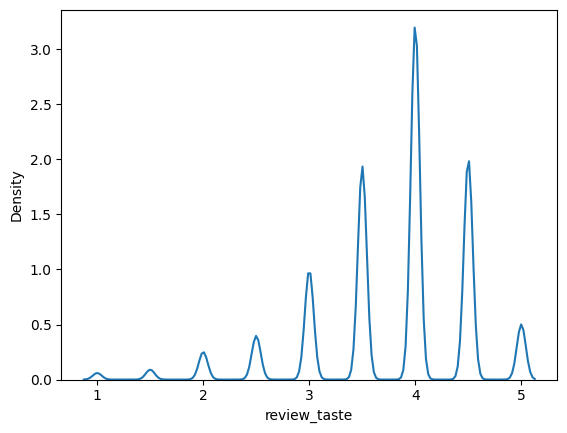

In [ ]:
from seaborn import kdeplot
kdeplot(df.review_taste)

<Axes: xlabel='review_appearance', ylabel='Density'>

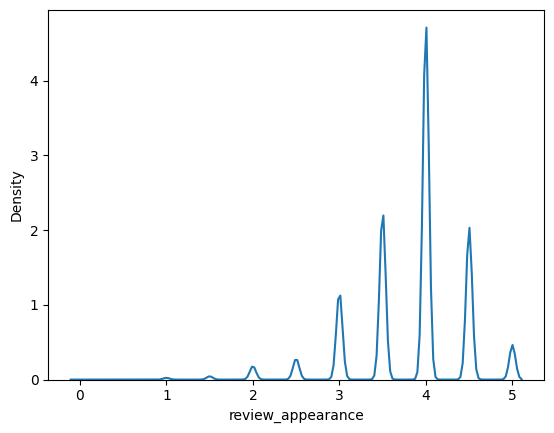

In [ ]:
from seaborn import kdeplot
kdeplot(df.review_appearance)

<Axes: xlabel='review_palate', ylabel='Density'>

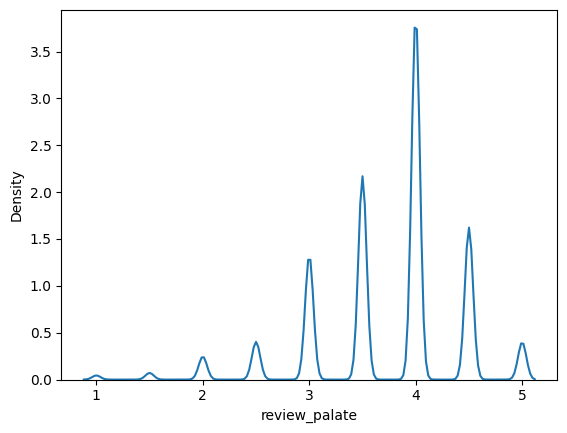

In [ ]:
from seaborn import kdeplot
kdeplot(df.review_palate)

# Identificando datos

Después de cargar el CSV decidimos que los datos que vamos a tomar para analizar seran review_overall que no ayudará a identificar a las cervezas que tienen una mejor reseña entre los catadores. El review_taste sera utilizado para identificar cuál de las cervezas tuvieron una mejor valoración en cuanto al sabor, el review_appearance y review_palate serán utilizado para ver cuales de las cervezas tiene una mejor apariencia y sabor en el paladar ya que como grupo que este es un factor también a tomar en cuenta. Además de todo esto se tendrá en cuenta a los datos de beer_abv para clasificar a las cervezas.

En los siguientes gráficos intentamos ver a más detalle la distribución de los anteriores datos que graficamos.


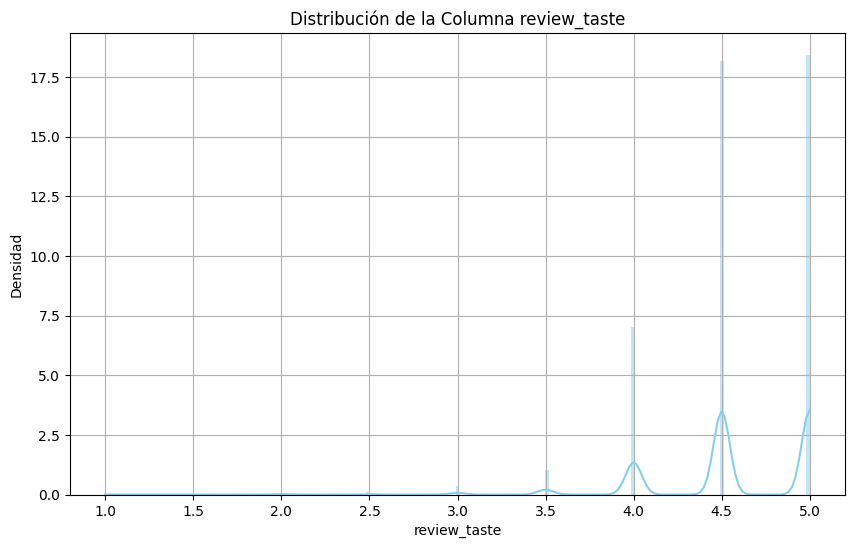

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Extraer la columna de interés
data = df['review_taste']

# Crear el histograma con una distribución normal superpuesta
plt.figure(figsize=(10, 6))
sns.histplot(data, kde=True, stat="density", linewidth=0, color='skyblue')
plt.title('Distribución de la Columna review_taste')
plt.xlabel('review_taste')
plt.ylabel('Densidad')
plt.grid(True)
plt.show()

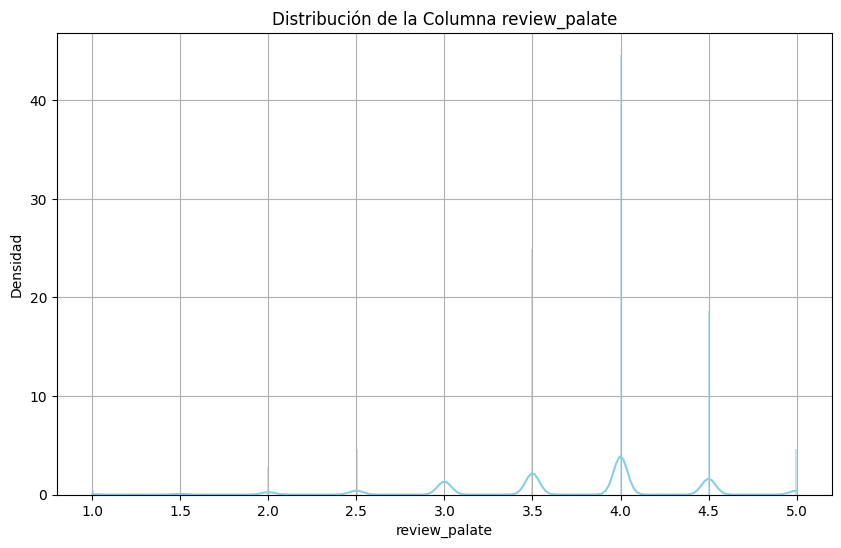

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Extraer la columna de interés
data = df['review_palate']

# Crear el histograma con una distribución normal superpuesta
plt.figure(figsize=(10, 6))
sns.histplot(data, kde=True, stat="density", linewidth=0, color='skyblue')
plt.title('Distribución de la Columna review_palate')
plt.xlabel('review_palate')
plt.ylabel('Densidad')
plt.grid(True)
plt.show()

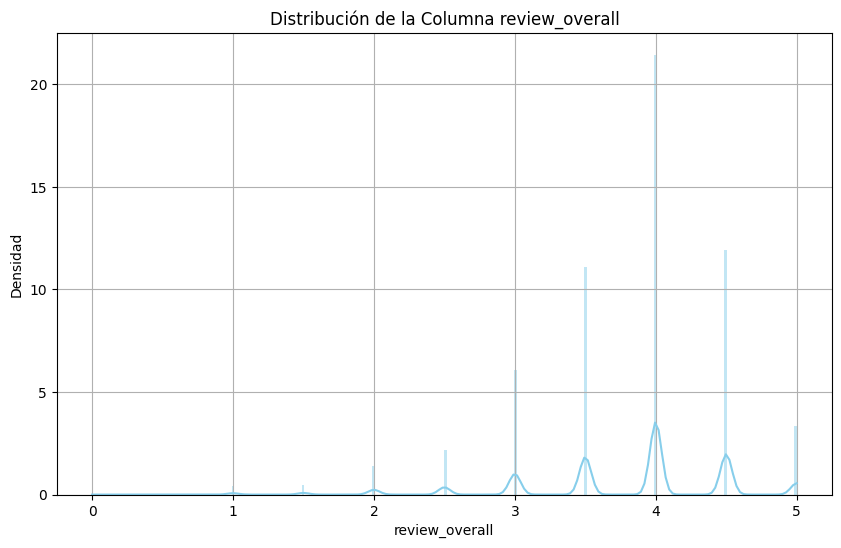

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Extraer la columna de interés
data = df['review_overall']

# Crear el histograma con una distribución normal superpuesta
plt.figure(figsize=(10, 6))
sns.histplot(data, kde=True, stat="density", linewidth=0, color='skyblue')
plt.title('Distribución de la Columna review_overall')
plt.xlabel('review_overall')
plt.ylabel('Densidad')
plt.grid(True)
plt.show()

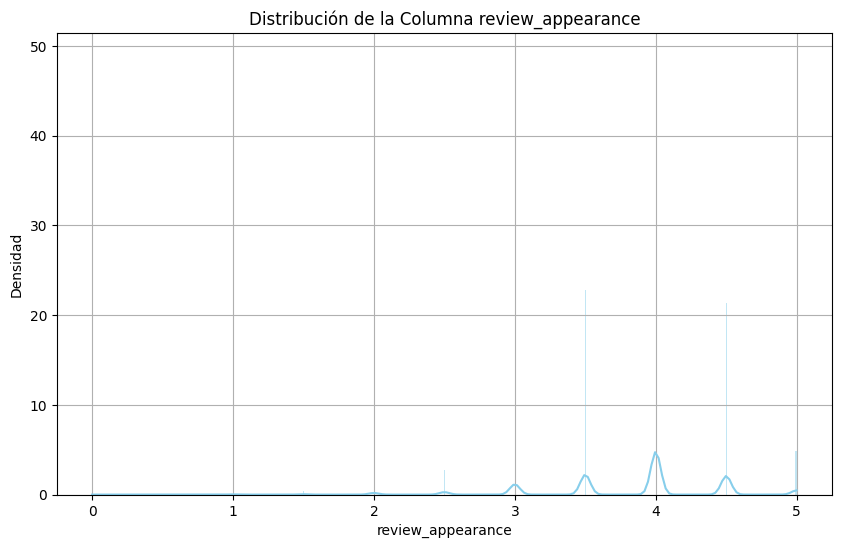

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Extraer la columna de interés
data = df['review_appearance']

# Crear el histograma con una distribución normal superpuesta
plt.figure(figsize=(10, 6))
sns.histplot(data, kde=True, stat="density", linewidth=0, color='skyblue')
plt.title('Distribución de la Columna review_appearance')
plt.xlabel('review_appearance')
plt.ylabel('Densidad')
plt.grid(True)
plt.show()

# Datos de tendencia central
en esta parte con la información que graficamos anteriormente no era suficiente así que queríamos tener a detalle de la media, moda y medina de los datos ya analizados


In [ ]:
#Codigo que analiza la media, mediana y moda de los datos
import pandas as pd
from scipy import stats


# codigo que ayuda a calcular la media de las rewies
media = df['review_overall'].mean()
print(f'Media: {media}')

# Codigo que ayuda a calcular la mediana de las rewies
mediana = df['review_overall'].median()
print(f'Mediana: {mediana}')

# Codigo que se usa para medir la moda de las rewies
moda = df['review_overall'].mode()
print(f'Moda: {moda.values}')

# Estadísticas descriptivas adicionales
estadisticas = df['review_overall'].describe()
print('\nEstadísticas descriptivas:')
print(estadisticas)

Media: 3.8781144211239
Mediana: 4.0
Moda: [4.]

Estadísticas descriptivas:
count    88620.000000
mean         3.878114
std          0.695637
min          0.000000
25%          3.500000
50%          4.000000
75%          4.500000
max          5.000000
Name: review_overall, dtype: float64


In [ ]:
#Codigo que analiza la media, mediana y moda de los datos
import pandas as pd
from scipy import stats


# codigo que ayuda a calcular la media del sabor
media = df['review_taste'].mean()
print(f'Media: {media}')

# Codigo que ayuda a calcular la mediana del sabor
mediana = df['review_taste'].median()
print(f'Mediana: {mediana}')

# Codigo que se usa para medir la moda del sabor
moda = df['review_taste'].mode()
print(f'Moda: {moda.values}')

# Estadísticas descriptivas adicionales
estadisticas = df['review_taste'].describe()
print('\nEstadísticas descriptivas:')
print(estadisticas)

Media: 3.8865380275332884
Mediana: 4.0
Moda: [4.]

Estadísticas descriptivas:
count    88620.000000
mean         3.886538
std          0.706509
min          1.000000
25%          3.500000
50%          4.000000
75%          4.500000
max          5.000000
Name: review_taste, dtype: float64


In [ ]:
#Codigo que analiza la media, mediana y moda de los datos
import pandas as pd
from scipy import stats


# codigo que ayuda a calcular la media de la apariencia
media = df['review_appearance'].mean()
print(f'Media: {media}')

# Codigo que ayuda a calcular la mediana de la apariencia
mediana = df['review_appearance'].median()
print(f'Mediana: {mediana}')

# Codigo que se usa para medir la moda de la apariencia
moda = df['review_appearance'].mode()
print(f'Moda: {moda.values}')

# Estadísticas descriptivas adicionales
estadisticas = df['review_appearance'].describe()
print('\nEstadísticas descriptivas:')
print(estadisticas)

Media: 3.9009986459038593
Mediana: 4.0
Moda: [4.]

Estadísticas descriptivas:
count    88620.000000
mean         3.900999
std          0.592547
min          0.000000
25%          3.500000
50%          4.000000
75%          4.500000
max          5.000000
Name: review_appearance, dtype: float64


In [ ]:
#Codigo que analiza la media, mediana y moda de los datos
import pandas as pd
from scipy import stats


# codigo que ayuda a calcular la media de la apariencia
media = df['review_palate'].mean()
print(f'Media: {media}')

# Codigo que ayuda a calcular la mediana de la apariencia
mediana = df['review_palate'].median()
print(f'Mediana: {mediana}')

# Codigo que se usa para medir la moda de la apariencia
moda = df['review_palate'].mode()
print(f'Moda: {moda.values}')

# Estadísticas descriptivas adicionales
estadisticas = df['review_palate'].describe()
print('\nEstadísticas descriptivas:')
print(estadisticas)

Media: 3.8274260889189797
Mediana: 4.0
Moda: [4.]

Estadísticas descriptivas:
count    88620.000000
mean         3.827426
std          0.658091
min          1.000000
25%          3.500000
50%          4.000000
75%          4.000000
max          5.000000
Name: review_palate, dtype: float64


# Gráfico de dispersión
En esta parte del proyecto tomamos los datos que analizamos anteriormente y los graficamos de tal forma que podamos ver cuales son los datos que destacan del resto.


Varianza de X: 0.519295876714356
Desviación estándar de X: 0.7206218680517238
Varianza de Y: 0.5357795098053175
Desviación estándar de Y: 0.7319696098919117


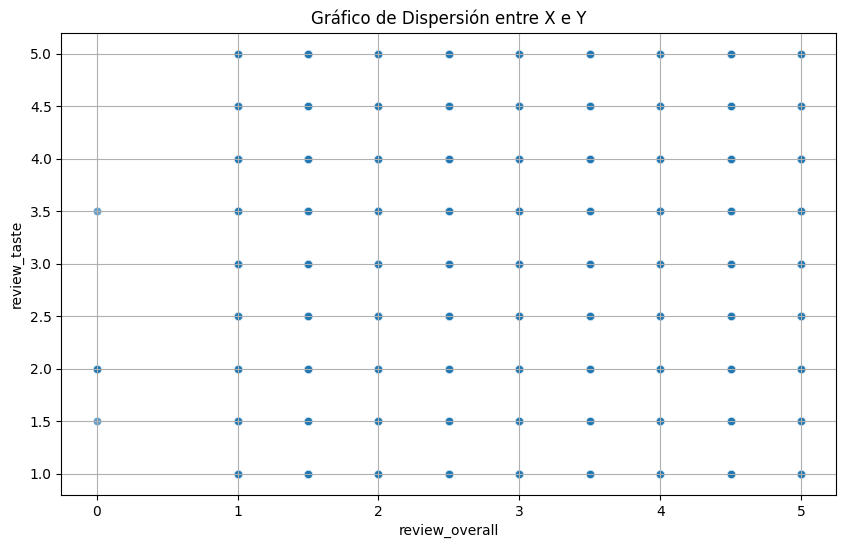

In [ ]:
# Importar las bibliotecas necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

varianza_x = df['review_overall'].var()
desviacion_x = df['review_overall'].std()

varianza_y = df['review_taste'].var()
desviacion_y = df['review_taste'].std()

print(f'Varianza de X: {varianza_x}')
print(f'Desviación estándar de X: {desviacion_x}')
print(f'Varianza de Y: {varianza_y}')
print(f'Desviación estándar de Y: {desviacion_y}')

# Crear un gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(x='review_overall', y='review_taste', data=df, alpha=0.7)
plt.title('Gráfico de Dispersión entre X e Y')
plt.xlabel('review_overall')
plt.ylabel('review_taste')
plt.grid(True)
plt.show()

Varianza de X: 5859025964738176.0
Desviación estándar de X: 76544274.53923759
Varianza de Y: 1.0000006302734188
Desviación estándar de Y: 1.0000003151366597


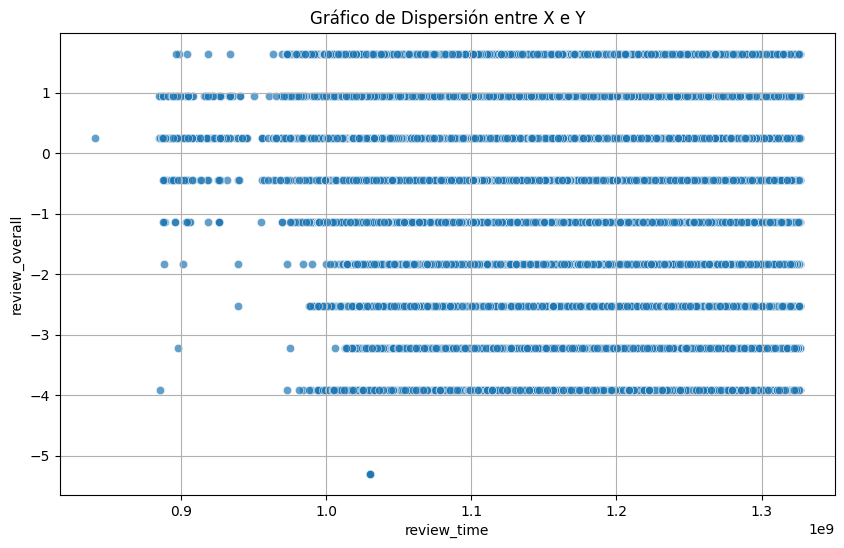

In [ ]:
# Importar las bibliotecas necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

varianza_x = df['review_time'].var()
desviacion_x = df['review_time'].std()

varianza_y = df['review_overall'].var()
desviacion_y = df['review_overall'].std()

print(f'Varianza de X: {varianza_x}')
print(f'Desviación estándar de X: {desviacion_x}')
print(f'Varianza de Y: {varianza_y}')
print(f'Desviación estándar de Y: {desviacion_y}')

# Crear un gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(x='review_time', y='review_overall', data=df, alpha=0.7)
plt.title('Gráfico de Dispersión entre X e Y')
plt.xlabel('review_time')
plt.ylabel('review_overall')
plt.grid(True)
plt.show()

Varianza de X: 5859025964738176.0
Desviación estándar de X: 76544274.53923759
Varianza de Y: 1.000000630273419
Desviación estándar de Y: 1.0000003151366599


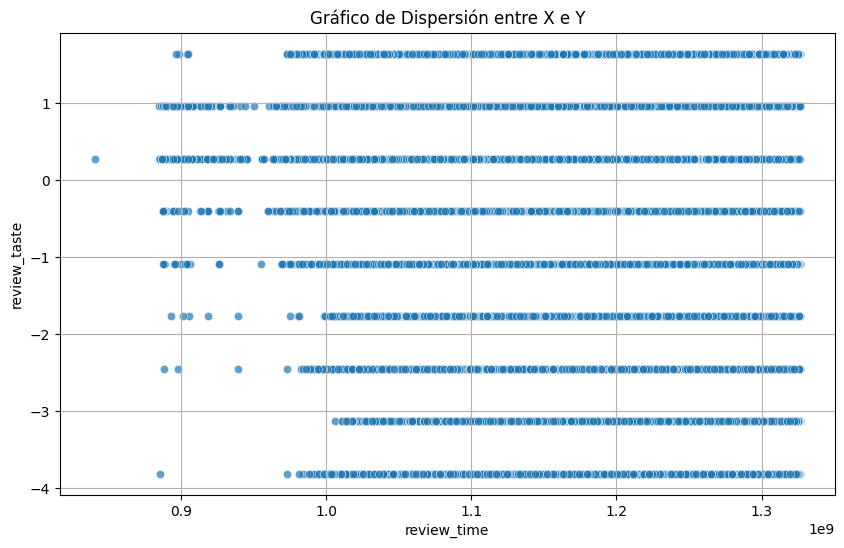

In [ ]:
# Importar las bibliotecas necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

varianza_x = df['review_time'].var()
desviacion_x = df['review_time'].std()

varianza_y = df['review_taste'].var()
desviacion_y = df['review_taste'].std()

print(f'Varianza de X: {varianza_x}')
print(f'Desviación estándar de X: {desviacion_x}')
print(f'Varianza de Y: {varianza_y}')
print(f'Desviación estándar de Y: {desviacion_y}')

# Crear un gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(x='review_time', y='review_taste', data=df, alpha=0.7)
plt.title('Gráfico de Dispersión entre X e Y')
plt.xlabel('review_time')
plt.ylabel('review_taste')
plt.grid(True)
plt.show()

Varianza de X: 5859025964738176.0
Desviación estándar de X: 76544274.53923759
Varianza de Y: 0.3795702998810948
Desviación estándar de Y: 0.6160927688920678


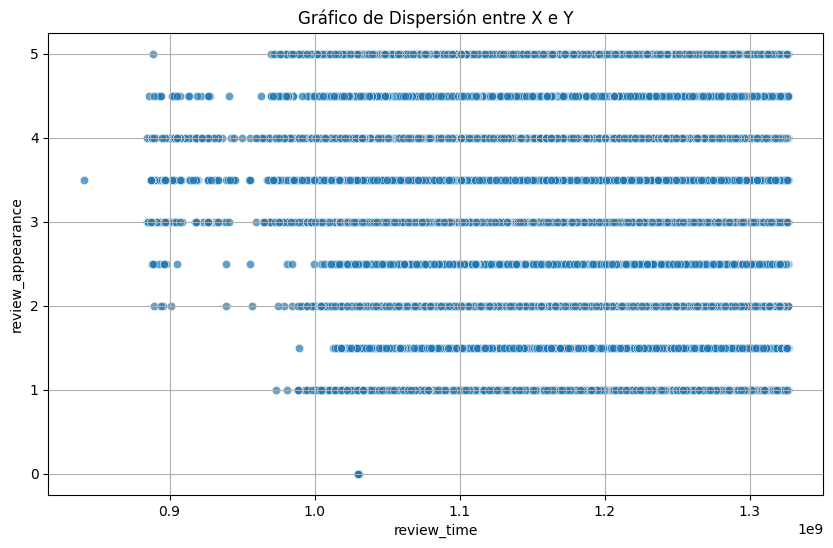

In [ ]:
# Importar las bibliotecas necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

varianza_x = df['review_time'].var()
desviacion_x = df['review_time'].std()

varianza_y = df['review_appearance'].var()
desviacion_y = df['review_appearance'].std()

print(f'Varianza de X: {varianza_x}')
print(f'Desviación estándar de X: {desviacion_x}')
print(f'Varianza de Y: {varianza_y}')
print(f'Desviación estándar de Y: {desviacion_y}')

# Crear un gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(x='review_time', y='review_appearance', data=df, alpha=0.7)
plt.title('Gráfico de Dispersión entre X e Y')
plt.xlabel('review_time')
plt.ylabel('review_appearance')
plt.grid(True)
plt.show()

Varianza de X: 5859025964738176.0
Desviación estándar de X: 76544274.53923759
Varianza de Y: 0.4654218953246297
Desviación estándar de Y: 0.6822183633739491


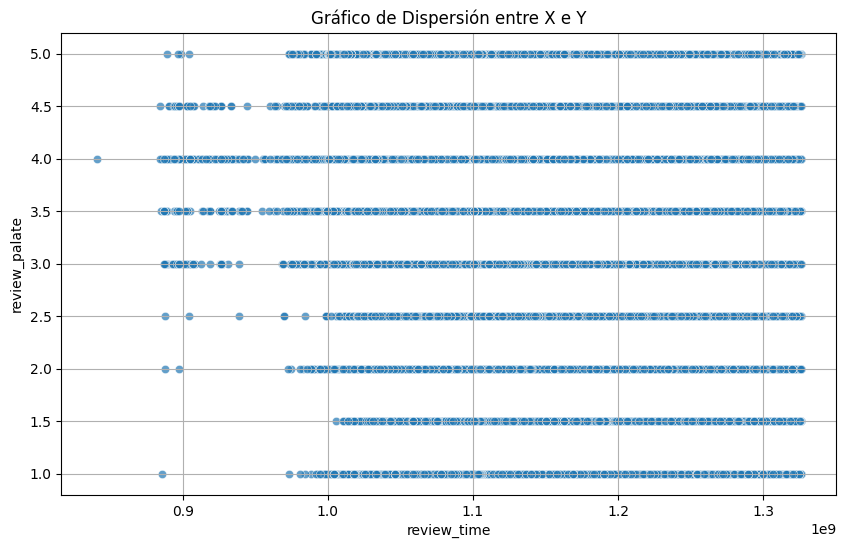

In [ ]:
# Importar las bibliotecas necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

varianza_x = df['review_time'].var()
desviacion_x = df['review_time'].std()

varianza_y = df['review_palate'].var()
desviacion_y = df['review_palate'].std()

print(f'Varianza de X: {varianza_x}')
print(f'Desviación estándar de X: {desviacion_x}')
print(f'Varianza de Y: {varianza_y}')
print(f'Desviación estándar de Y: {desviacion_y}')

# Crear un gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(x='review_time', y='review_palate', data=df, alpha=0.7)
plt.title('Gráfico de Dispersión entre X e Y')
plt.xlabel('review_time')
plt.ylabel('review_palate')
plt.grid(True)
plt.show()

# Fase 3: Prepare Data



#Deletion of null data

In this stage of the project we will dedicate ourselves as a group to preparing the data in a better way to be able to have only the best.

En esta etapa del proyecto nos dedicaremos como grupo a preparar los datos de mejor forma para poder tener solo los mejores.

We eliminate data that is null from the CSV

Eliminamos los dato que sean nulos del CSV

The elimination of null data will help us better identify the information we need from the CSV. This is done in case there is null or missing data that affects our analysis.


La eliminación de los datos nulos nos ayudarán a identificar de mejor manera la información que necesitamos del csv, este se hace por si acaso llegara a haber un dato nulo o faltante que afecte a nuestro analisis

In [ ]:
df.shape

(176905, 13)

In [ ]:
df = df.dropna()

In [ ]:
df.shape

(86034, 13)

After this data removal, we can realize that at least 68,136 of the table were null. This will help us avoid mistakes in our detailed analysis of the beers.


Después de esta eliminación de datos, podemos darnos cuenta de que al menos 68,136 de la tabla eran nulos. Esto nos ayudará a no tener fallas en nuestro análisis detallado de las cervezas.

# normalización y estandarización de los datos

Standardization and normalization are necessary for the preprocessing of beer data, this process can significantly improve the performance and stability of our future models. Additionally, the data that we pass through these processes will be treated fairly and appropriately, facilitating more effective analysis and more accurate results.




La estandarización y normalización son necesarios para el preprocesamiento de los datos de las cervezas, este proceso puede mejorar significativamente el rendimiento y la estabilidad de nuestros futuros modelos. Ademas, los datos que pasemos por estos procesos seran tratados de manera justa y adecuada, facilitando un análisis más efectivo y resultados más precisos.

( 'review_overall','review_aroma', 'review_appearance',
                   'review_palate', 'review_taste', 'beer_abv')

In [ ]:
#Normalizacion de los datos cerveciles
from sklearn.preprocessing import MinMaxScaler

# Crear el escalador
scaler = MinMaxScaler()

# Normalizar solo las columnas 'A' y 'B'
df[['review_overall', 'beer_abv', 'review_aroma', 'review_appearance' , 'review_palate' , 'review_taste' ]] = scaler.fit_transform(df[['review_overall', 'beer_abv', 'review_aroma', 'review_appearance' , 'review_palate' , 'review_taste' ]])

# Mostrar el DataFrame con columnas normalizadas
print(df)

        brewery_id                  brewery_name   review_time  \
0            10325               Vecchio Birraio  1.234818e+09   
1            10325               Vecchio Birraio  1.235915e+09   
2            10325               Vecchio Birraio  1.235917e+09   
3            10325               Vecchio Birraio  1.234725e+09   
4             1075       Caldera Brewing Company  1.293735e+09   
...            ...                           ...           ...   
176899        3052  Hook Norton Brewery Co. Ltd.  1.207019e+09   
176900        3052  Hook Norton Brewery Co. Ltd.  1.206228e+09   
176901        3052  Hook Norton Brewery Co. Ltd.  1.177193e+09   
176902        3052  Hook Norton Brewery Co. Ltd.  1.170833e+09   
176903        3052  Hook Norton Brewery Co. Ltd.  1.146714e+09   

        review_overall  review_aroma  review_appearance review_profilename  \
0                  0.3         0.250                0.5            stcules   
1                  0.6         0.375               

In [ ]:
#Estandarizacion de los datos cerveciles
from sklearn.preprocessing import StandardScaler

# Crear el escalador
scaler = StandardScaler()

# Estandarizar solo las columnas 'A' y 'B'
df[['review_overall', 'beer_abv', 'review_aroma', 'review_appearance' , 'review_palate' , 'review_taste' ]] = scaler.fit_transform(df[['review_overall', 'beer_abv', 'review_aroma', 'review_appearance' , 'review_palate' , 'review_taste' ]])

# Mostrar el DataFrame con columnas estandarizadas
print(df)

        brewery_id                  brewery_name   review_time  \
0            10325               Vecchio Birraio  1.234818e+09   
1            10325               Vecchio Birraio  1.235915e+09   
2            10325               Vecchio Birraio  1.235917e+09   
3            10325               Vecchio Birraio  1.234725e+09   
4             1075       Caldera Brewing Company  1.293735e+09   
...            ...                           ...           ...   
176899        3052  Hook Norton Brewery Co. Ltd.  1.207019e+09   
176900        3052  Hook Norton Brewery Co. Ltd.  1.206228e+09   
176901        3052  Hook Norton Brewery Co. Ltd.  1.177193e+09   
176902        3052  Hook Norton Brewery Co. Ltd.  1.170833e+09   
176903        3052  Hook Norton Brewery Co. Ltd.  1.146714e+09   

        review_overall  review_aroma  review_appearance review_profilename  \
0            -3.438073     -2.695559          -2.354764            stcules   
1            -1.264599     -1.952210          -1.50

After better optimizing the data that we as a group considered main, we will begin to graph and size the information extracted from it,


Despues de optimisar de mejor manera los datos que como grupo concideramos principales, comenzaremas a graficar y dimensionar la informacion extraida de estos mismo,

# Outliers data processing
For this section of the dataset preparation we take the data to eliminate those that are Outliers. We use an IQR-based treatment for outliers.




# Tratamiento de datos Outliers
Para esta sección de la preparación del dataset tomamos los datos para eliminar los que sean Outliers. Utilizamos un tratamiento basado en el método IQR para los valores atípicos.


Datos originales:
   brewery_id             brewery_name  review_time  review_overall  \
0       10325          Vecchio Birraio   1234817823             1.5   
1       10325          Vecchio Birraio   1235915097             3.0   
2       10325          Vecchio Birraio   1235916604             3.0   
3       10325          Vecchio Birraio   1234725145             3.0   
4        1075  Caldera Brewing Company   1293735206             4.0   

   review_aroma  review_appearance review_profilename  \
0           2.0                2.5            stcules   
1           2.5                3.0            stcules   
2           2.5                3.0            stcules   
3           3.0                3.5            stcules   
4           4.5                4.0     johnmichaelsen   

                       beer_style  review_palate  review_taste  \
0                      Hefeweizen            1.5           1.5   
1              English Strong Ale            3.0           3.0   
2          For

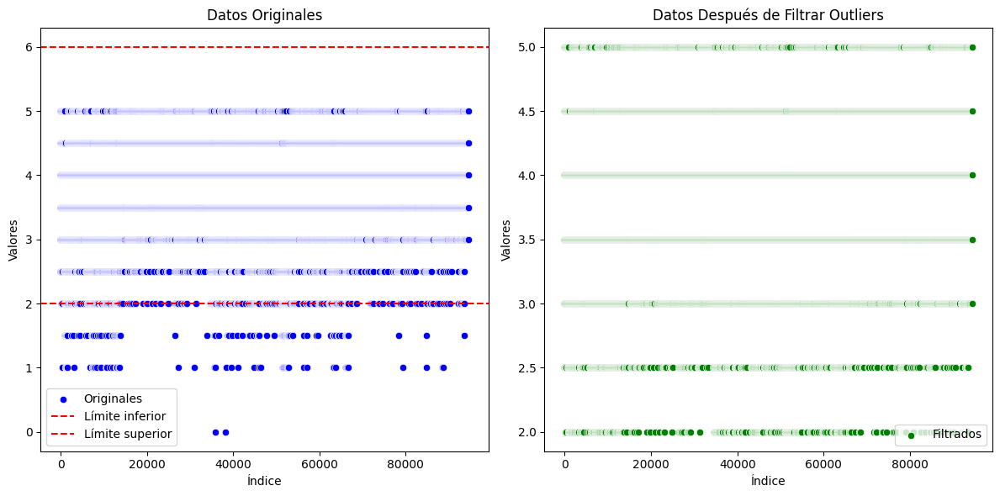

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Muestra las primeras filas del dataframe para verificar su contenido
print("Datos originales:")
print(df.head())


data = df['review_appearance']

# Calcular los cuartiles
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)

# Calcular el rango intercuartílico (IQR)
IQR = Q3 - Q1

# Definir los límites para los valores válidos
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtrar los datos para eliminar outliers
filtered_data = data[(data >= lower_bound) & (data <= upper_bound)]

# Crear un nuevo DataFrame con los datos sin los outliers
filtered_df = df[(df['review_appearance'] >= lower_bound) & (df['review_appearance'] <= upper_bound)]

# Crear gráficos de dispersión con los datos
plt.figure(figsize=(12, 6))

# Gráfico de dispersión de datos originales
plt.subplot(1, 2, 1)
sns.scatterplot(x=np.arange(len(data)), y=data, color='blue', label='Originales')
plt.axhline(y=lower_bound, color='r', linestyle='--', label='Límite inferior')
plt.axhline(y=upper_bound, color='r', linestyle='--', label='Límite superior')
plt.title('Datos Originales')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

# Gráfico de dispersión de datos filtrados
plt.subplot(1, 2, 2)
sns.scatterplot(x=np.arange(len(filtered_data)), y=filtered_data, color='green', label='Filtrados')
plt.title('Datos Después de Filtrar Outliers')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

plt.tight_layout()
plt.show()

Datos originales:
   brewery_id             brewery_name  review_time  review_overall  \
0       10325          Vecchio Birraio   1234817823             1.5   
1       10325          Vecchio Birraio   1235915097             3.0   
2       10325          Vecchio Birraio   1235916604             3.0   
3       10325          Vecchio Birraio   1234725145             3.0   
4        1075  Caldera Brewing Company   1293735206             4.0   

   review_aroma  review_appearance review_profilename  \
0           2.0                2.5            stcules   
1           2.5                3.0            stcules   
2           2.5                3.0            stcules   
3           3.0                3.5            stcules   
4           4.5                4.0     johnmichaelsen   

                       beer_style  review_palate  review_taste  \
0                      Hefeweizen            1.5           1.5   
1              English Strong Ale            3.0           3.0   
2          For

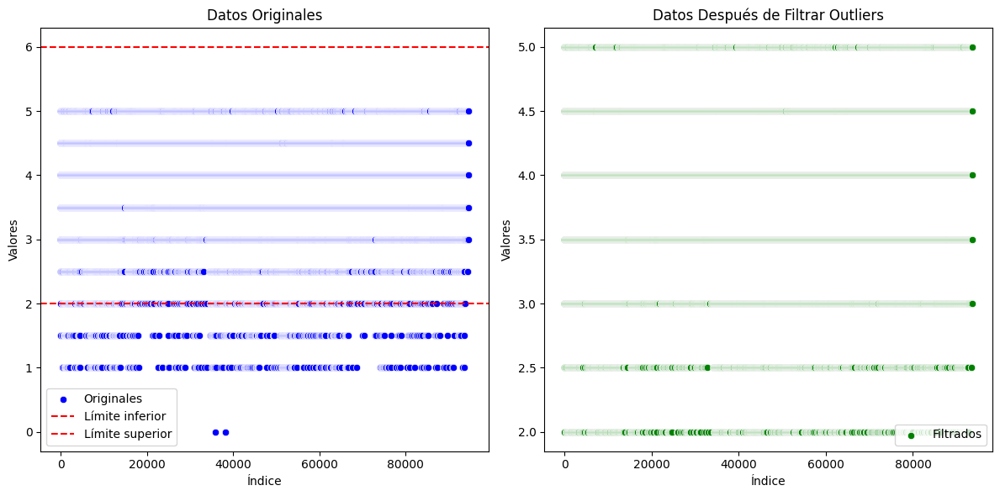

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Muestra las primeras filas del dataframe para verificar su contenido
print("Datos originales:")
print(df.head())


data = df['review_overall']

# Calcular los cuartiles
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)

# Calcular el rango intercuartílico (IQR)
IQR = Q3 - Q1

# Definir los límites para los valores válidos
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtrar los datos para eliminar outliers
filtered_data = data[(data >= lower_bound) & (data <= upper_bound)]

# Crear un nuevo DataFrame con los datos sin outliers
filtered_df = df[(df['review_overall'] >= lower_bound) & (df['review_overall'] <= upper_bound)]

# Crear gráficos de dispersión
plt.figure(figsize=(12, 6))

# Gráfico de dispersión de datos originales
plt.subplot(1, 2, 1)
sns.scatterplot(x=np.arange(len(data)), y=data, color='blue', label='Originales')
plt.axhline(y=lower_bound, color='r', linestyle='--', label='Límite inferior')
plt.axhline(y=upper_bound, color='r', linestyle='--', label='Límite superior')
plt.title('Datos Originales')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

# Gráfico de dispersión de datos filtrados
plt.subplot(1, 2, 2)
sns.scatterplot(x=np.arange(len(filtered_data)), y=filtered_data, color='green', label='Filtrados')
plt.title('Datos Después de Filtrar Outliers')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

plt.tight_layout()
plt.show()

Datos originales:
   brewery_id             brewery_name   review_time  review_overall  \
0       10325          Vecchio Birraio  1.234818e+09       -3.438073   
1       10325          Vecchio Birraio  1.235915e+09       -1.264599   
2       10325          Vecchio Birraio  1.235917e+09       -1.264599   
3       10325          Vecchio Birraio  1.234725e+09       -1.264599   
4        1075  Caldera Brewing Company  1.293735e+09        0.184383   

   review_aroma  review_appearance review_profilename  \
0     -2.695559          -2.354764            stcules   
1     -1.952210          -1.508684            stcules   
2     -1.952210          -1.508684            stcules   
3     -1.208862          -0.662603            stcules   
4      1.021184           0.183477     johnmichaelsen   

                       beer_style  review_palate  review_taste  \
0                      Hefeweizen      -3.539804     -3.388700   
1              English Strong Ale      -1.243704     -1.244187   
2       

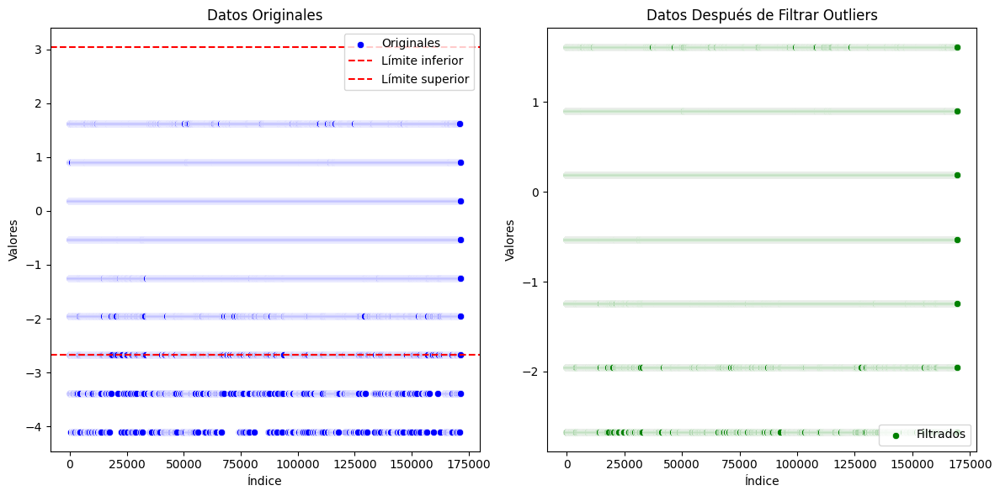

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Muestra las primeras filas del dataframe para verificar su contenido
print("Datos originales:")
print(df.head())


data = df['review_taste']

# Calcular los cuartiles
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)

# Calcular el rango intercuartílico (IQR)
IQR = Q3 - Q1

# Definir los límites para los valores válidos
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtrar los datos para eliminar outliers
filtered_data = data[(data >= lower_bound) & (data <= upper_bound)]

# Crear un nuevo DataFrame con los datos sin outliers
filtered_df = df[(df['review_taste'] >= lower_bound) & (df['review_taste'] <= upper_bound)]

# Crear gráficos de dispersión
plt.figure(figsize=(12, 6))

# Gráfico de dispersión de datos originales
plt.subplot(1, 2, 1)
sns.scatterplot(x=np.arange(len(data)), y=data, color='blue', label='Originales')
plt.axhline(y=lower_bound, color='r', linestyle='--', label='Límite inferior')
plt.axhline(y=upper_bound, color='r', linestyle='--', label='Límite superior')
plt.title('Datos Originales')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

# Gráfico de dispersión de datos filtrados
plt.subplot(1, 2, 2)
sns.scatterplot(x=np.arange(len(filtered_data)), y=filtered_data, color='green', label='Filtrados')
plt.title('Datos Después de Filtrar Outliers')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

plt.tight_layout()
plt.show()

Datos originales:
   brewery_id             brewery_name   review_time  review_overall  \
0       10325          Vecchio Birraio  1.234818e+09       -3.438073   
1       10325          Vecchio Birraio  1.235915e+09       -1.264599   
2       10325          Vecchio Birraio  1.235917e+09       -1.264599   
3       10325          Vecchio Birraio  1.234725e+09       -1.264599   
4        1075  Caldera Brewing Company  1.293735e+09        0.184383   

   review_aroma  review_appearance review_profilename  \
0     -2.695559          -2.354764            stcules   
1     -1.952210          -1.508684            stcules   
2     -1.952210          -1.508684            stcules   
3     -1.208862          -0.662603            stcules   
4      1.021184           0.183477     johnmichaelsen   

                       beer_style  review_palate  review_taste  \
0                      Hefeweizen      -3.539804     -3.388700   
1              English Strong Ale      -1.243704     -1.244187   
2       

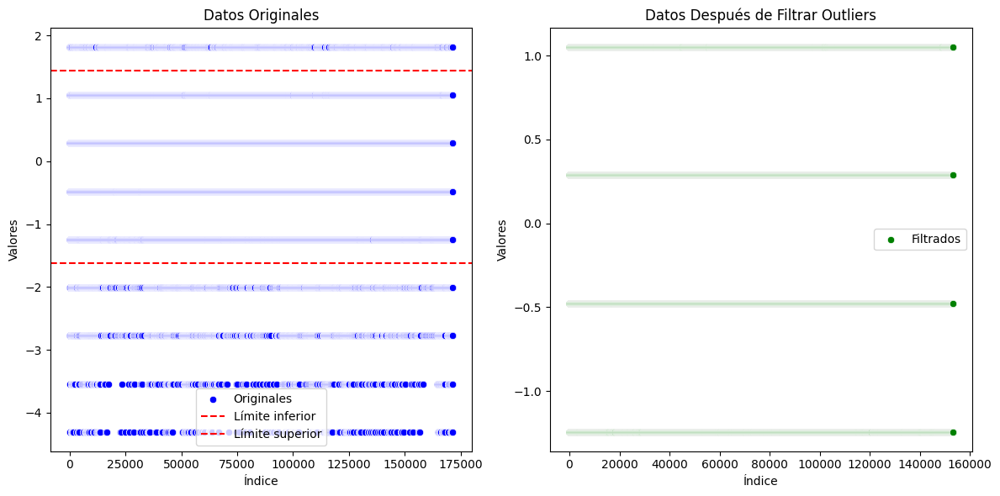

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Muestra las primeras filas del dataframe para verificar su contenido
print("Datos originales:")
print(df.head())


data = df['review_palate']

# Calcular los cuartiles
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)

# Calcular el rango intercuartílico (IQR)
IQR = Q3 - Q1

# Definir los límites para los valores válidos
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtrar los datos para eliminar outliers
filtered_data = data[(data >= lower_bound) & (data <= upper_bound)]

# Crear un nuevo DataFrame con los datos sin outliers
filtered_df = df[(df['review_palate'] >= lower_bound) & (df['review_palate'] <= upper_bound)]

# Crear gráficos de dispersión
plt.figure(figsize=(12, 6))

# Gráfico de dispersión de datos originales
plt.subplot(1, 2, 1)
sns.scatterplot(x=np.arange(len(data)), y=data, color='blue', label='Originales')
plt.axhline(y=lower_bound, color='r', linestyle='--', label='Límite inferior')
plt.axhline(y=upper_bound, color='r', linestyle='--', label='Límite superior')
plt.title('Datos Originales')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

# Gráfico de dispersión de datos filtrados
plt.subplot(1, 2, 2)
sns.scatterplot(x=np.arange(len(filtered_data)), y=filtered_data, color='green', label='Filtrados')
plt.title('Datos Después de Filtrar Outliers')
plt.xlabel('Índice')
plt.ylabel('Valores')
plt.legend()

plt.tight_layout()
plt.show()

# Mapas de calor

We graph using heat maps to see which data is so correlated and which is not


Graficamos mediante mapas de calor para ver que datos es tan correlacionados y cuales no

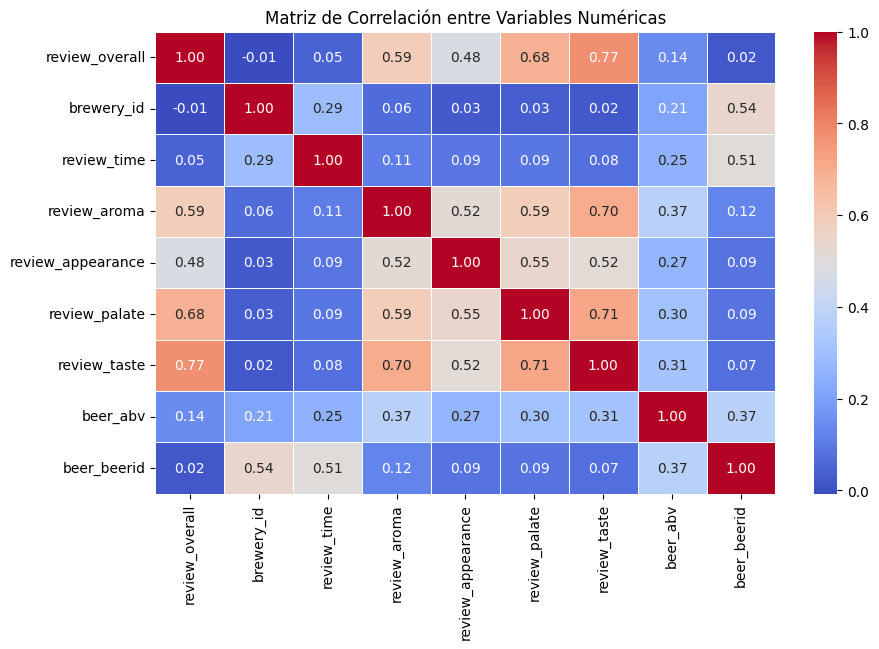

In [ ]:
# Importar las bibliotecas necesarias
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las columnas numéricas para la correlación
numeric_columns = ['review_overall','brewery_id', 'review_time','review_aroma', 'review_appearance','review_palate', 'review_taste', 'beer_abv','beer_beerid']

# Calcular la matriz de correlación
correlation_matrix = df[numeric_columns].corr()

# Crear la matriz de calor
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")
plt.title('Matriz de Correlación entre Variables Numéricas')
plt.show()

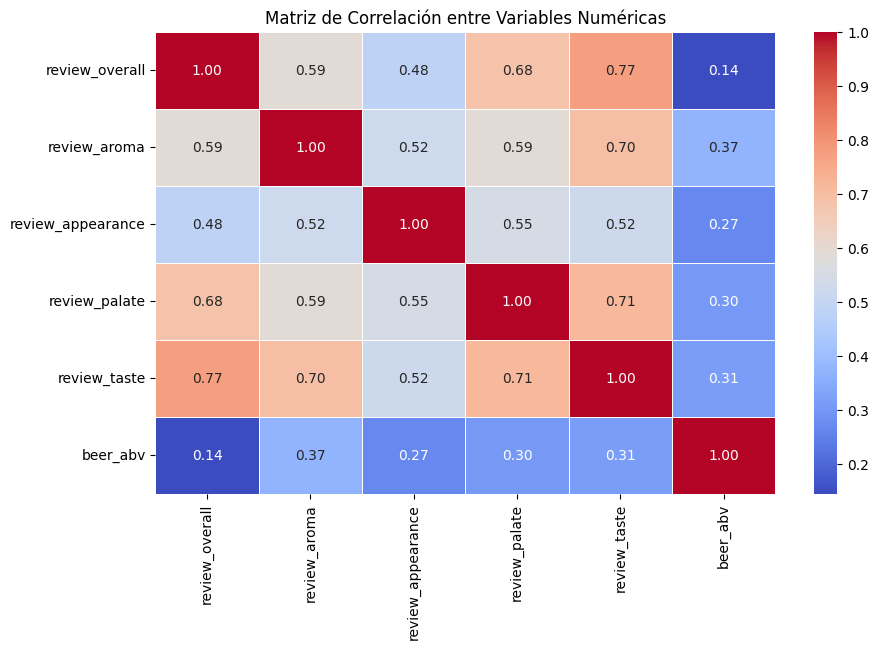

In [ ]:
# Importar las bibliotecas necesarias
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las columnas numéricas para la correlación
numeric_columns = [ 'review_overall','review_aroma', 'review_appearance',
                   'review_palate', 'review_taste', 'beer_abv']

# Calcular la matriz de correlación
correlation_matrix = df[numeric_columns].corr()

# Crear la matriz de calor
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")
plt.title('Matriz de Correlación entre Variables Numéricas')
plt.show()

We removed review_profilename since for us as a team it is not necessary for the future of the project.


Eliminamos review_profilename ya que para nosotros como equipo no es necesario para el futuro del proyecto.

In [ ]:
df = df.dropna()
df.columns
df2=df.drop(["review_profilename"], axis=1, inplace=True)

In [ ]:
df.columns

Index(['brewery_id', 'brewery_name', 'review_time', 'review_overall',
       'review_aroma', 'review_appearance', 'beer_style', 'review_palate',
       'review_taste', 'beer_name', 'beer_abv', 'beer_beerid'],
      dtype='object')

#Data leak
In this part we take review_overall as the main data to filter the beer data and thus answer the question of which of the beers is the best.


#Filtración de datos
En esta parte tomamos como dato principal el de review_overall para filtrar los datos de las cerveza y así responder a la pregunta de cuál de las cervezas es la mejor.


In this data filtering we only take into account data that is greater than or equal to 4.5, leaving us with a total of 403,000 data, which is quite a lot.


En este filtrado de datos solo tomamos en cuenta los datos que sean mayor o igual a 4.5 dejándonos con un total de 403.000 datos lo cual es bastante.

# Filtracion de cervezas por graduacion alcoholica

In [ ]:
#Filtrando datos con el beer_abv para cervezas suaves
Cervezas_Suave = df[df['beer_abv'] >=3.5]


In [ ]:
Cervezas_Suave

,brewery_id,brewery_name,review_time,review_overall,review_aroma,review_appearance,beer_style,review_palate,review_taste,beer_name,beer_abv,beer_beerid
9634,395,Bluegrass Brewing Co. - East St. Matthew's,1.227632e+09,0.184383,1.021184,0.183477,American Double / Imperial Stout,1.052397,0.185488,Jeffersons Reserve Big Fella Bourbon Barrel Stout,3.872557,45774.0
9635,395,Bluegrass Brewing Co. - East St. Matthew's,1.226033e+09,-0.540108,-0.465513,-0.662603,American Double / Imperial Stout,0.287030,-0.529350,Jeffersons Reserve Big Fella Bourbon Barrel Stout,3.872557,45774.0
12911,6513,Schorschbräu,1.283881e+09,0.184383,-0.465513,-1.508684,Doppelbock,-0.478337,0.185488,Schorschbock,3.872557,47421.0
12912,6513,Schorschbräu,1.262985e+09,-0.540108,-1.208862,-1.508684,Doppelbock,-1.243704,-0.529350,Schorschbock,3.872557,47421.0
12913,6513,Schorschbräu,1.256279e+09,0.184383,-0.465513,-1.508684,Doppelbock,-1.243704,0.185488,Schorschbock,3.872557,47421.0
...,...,...,...,...,...,...,...,...,...,...,...,...
129083,848,Bristol Brewing Company,1.170865e+09,-1.989090,-0.465513,-1.508684,American Double / Imperial Stout,-2.009070,-1.244187,XXX Warlock Double Imperial Stout,4.938527,32963.0
129084,848,Bristol Brewing Company,1.170745e+09,1.633365,1.021184,1.029558,American Double / Imperial Stout,1.817763,0.900325,XXX Warlock Double Imperial Stout,4.938527,32963.0
129085,848,Bristol Brewing Company,1.170027e+09,0.908874,1.764533,1.029558,American Double / Imperial Stout,-0.478337,1.615163,XXX Warlock Double Imperial Stout,4.938527,32963.0
129086,848,Bristol Brewing Company,1.170015e+09,1.633365,1.764533,1.875638,American Double / Imperial Stout,1.817763,0.900325,XXX Warlock Double Imperial Stout,4.938527,32963.0


In [ ]:
#Filtrando datos con el beer_abv para cervezas estandar
Cervezas_Estandar = df[df['beer_abv'] <=5.5]


In [ ]:
Cervezas_Estandar

,brewery_id,brewery_name,review_time,review_overall,review_aroma,review_appearance,review_profilename,beer_style,review_palate,review_taste,beer_name,beer_abv,beer_beerid
0,10325,Vecchio Birraio,1234817823,-3.213310,-2.487952,-2.177663,stcules,Hefeweizen,-3.288833,-3.132454,Sausa Weizen,-0.879382,47986
1,10325,Vecchio Birraio,1235915097,-1.131774,-1.771225,-1.366096,stcules,English Strong Ale,-1.090123,-1.083188,Red Moon,-0.362703,48213
2,10325,Vecchio Birraio,1235916604,-1.131774,-1.771225,-1.366096,stcules,Foreign / Export Stout,-1.090123,-1.083188,Black Horse Black Beer,-0.233533,48215
3,10325,Vecchio Birraio,1234725145,-1.131774,-1.054499,-0.554530,stcules,German Pilsener,-1.823026,-1.083188,Sausa Pils,-0.879382,47969
4,1075,Caldera Brewing Company,1293735206,0.255917,1.095679,0.257037,johnmichaelsen,American Double / Imperial IPA,0.375684,0.966078,Cauldron DIPA,0.283146,64883
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1586609,14359,The Defiant Brewing Company,1162684892,1.643608,0.378953,-0.554530,maddogruss,Pumpkin Ale,0.375684,0.282989,The Horseman's Ale,-0.793269,33061
1586610,14359,The Defiant Brewing Company,1161048566,0.255917,1.812405,-2.177663,yelterdow,Pumpkin Ale,-2.555929,0.282989,The Horseman's Ale,-0.793269,33061
1586611,14359,The Defiant Brewing Company,1160702513,0.949762,-0.337773,-1.366096,TongoRad,Pumpkin Ale,-0.357219,0.282989,The Horseman's Ale,-0.793269,33061
1586612,14359,The Defiant Brewing Company,1160023044,0.255917,1.095679,1.068603,dherling,Pumpkin Ale,1.108588,0.966078,The Horseman's Ale,-0.793269,33061


In [ ]:
#Filtrando datos con el beer_abv para cervezas fuertes
Cervezas_Fuertes = df[df['beer_abv'] >5.5]

In [ ]:
Cervezas_Fuertes

,brewery_id,brewery_name,review_time,review_overall,review_aroma,review_appearance,review_profilename,beer_style,review_palate,review_taste,beer_name,beer_abv,beer_beerid
12918,6513,Schorschbräu,1248785936,-0.437929,0.378953,0.257037,kappldav123,Eisbock,0.375684,0.966078,Schorschbräu Schorschbock 31%,10.255050,51466
12919,6513,Schorschbräu,1316780901,0.255917,0.378953,0.257037,kappldav123,Eisbock,0.375684,-0.400099,Schorschbräu Schorschbock 57%,21.811437,73368
12934,6513,Schorschbräu,1264684153,0.255917,1.095679,1.068603,kappldav123,Eisbock,0.375684,0.966078,Schorschbräu Schorschbock 40%,13.949305,55712
12939,6513,Schorschbräu,1309974178,0.255917,0.378953,-0.554530,Sunnanek,Eisbock,0.375684,0.282989,Schorschbräu Schorschbock 43%,15.482120,57856
12940,6513,Schorschbräu,1274469798,-0.437929,0.378953,0.257037,kappldav123,Eisbock,0.375684,0.966078,Schorschbräu Schorschbock 43%,15.482120,57856
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1386403,1924,DuClaw Brewing Company,1265957224,-1.825619,0.378953,0.257037,willPS21,American Strong Ale,0.375684,-0.400099,Colossus,6.405792,48881
1386404,1924,DuClaw Brewing Company,1243749469,-1.131774,-0.337773,0.257037,ChainGangGuy,American Strong Ale,0.375684,0.282989,Colossus,6.405792,48881
1386405,1924,DuClaw Brewing Company,1238893861,-0.437929,-0.337773,0.257037,BeerSox,American Strong Ale,0.375684,0.282989,Colossus,6.405792,48881
1386406,1924,DuClaw Brewing Company,1238768944,0.949762,1.095679,1.068603,beermantimmie,American Strong Ale,1.108588,0.282989,Colossus,6.405792,48881


# Filtracion de las cervezas por review general

In [ ]:
# Filtrar las filas donde 'review_overall' es mayor o igual a 4.5
filtered_df = df[df['review_overall'] >= 4.5]

In [ ]:
filtered_df

,brewery_id,brewery_name,review_time,review_overall,review_aroma,review_appearance,beer_style,review_palate,review_taste,beer_name,beer_abv,beer_beerid
9,1075,Caldera Brewing Company,1285632924,4.5,3.5,5.0,Herbed / Spiced Beer,4.0,4.0,Caldera Ginger Beer,4.7,52159
11,1075,Caldera Brewing Company,1283154365,5.0,5.0,4.0,Herbed / Spiced Beer,4.0,4.0,Caldera Ginger Beer,4.7,52159
19,1075,Caldera Brewing Company,1325478004,4.5,4.5,3.0,Rauchbier,4.0,4.5,Rauch Ür Bock,7.4,58046
22,1075,Caldera Brewing Company,1320494397,4.5,5.0,4.5,Rauchbier,4.0,4.5,Rauch Ür Bock,7.4,58046
24,1075,Caldera Brewing Company,1319847514,4.5,4.5,4.0,Rauchbier,4.0,4.5,Rauch Ür Bock,7.4,58046
...,...,...,...,...,...,...,...,...,...,...,...,...
1586606,14359,The Defiant Brewing Company,1162871808,5.0,4.5,4.0,Pumpkin Ale,5.0,5.0,The Horseman's Ale,5.2,33061
1586607,14359,The Defiant Brewing Company,1162865640,5.0,5.0,4.5,Pumpkin Ale,5.0,4.5,The Horseman's Ale,5.2,33061
1586609,14359,The Defiant Brewing Company,1162684892,5.0,4.0,3.5,Pumpkin Ale,4.0,4.0,The Horseman's Ale,5.2,33061
1586611,14359,The Defiant Brewing Company,1160702513,4.5,3.5,3.0,Pumpkin Ale,3.5,4.0,The Horseman's Ale,5.2,33061


For the second filtering of the data we took into account only the data that is greater than or equal to 5.0, since we wanted to see which were the best beers that were classified in the data.


Para el segundo filtrado de los datos tomamos en cuenta sólo los datos que sean mayor o igual a 5.0, ya que queríamos ver cuales eran las mejores cervezas que estaban clasificadas en los datos.


In [ ]:
# Filtrar las filas donde 'review_overall' es mayor o igual a 5
filtered_df_2 = df[df['review_overall'] >=5.0]

In [ ]:
filtered_df_2

,brewery_id,brewery_name,review_time,review_overall,review_aroma,review_appearance,review_profilename,beer_style,review_palate,review_taste,beer_name,beer_abv,beer_beerid
0,1075,Caldera Brewing Company,1283154365,5.0,5.0,4.0,MadeInOregon,Herbed / Spiced Beer,4.0,4.0,Caldera Ginger Beer,4.7,52159
1,1075,Caldera Brewing Company,1318802642,5.0,5.0,3.5,optimator13,Rauchbier,3.5,5.0,Rauch Ür Bock,7.4,58046
2,1075,Caldera Brewing Company,1315014054,5.0,4.5,4.0,Bung,Rauchbier,4.0,5.0,Rauch Ür Bock,7.4,58046
3,1075,Caldera Brewing Company,1305926255,5.0,4.5,3.5,Deuane,Rauchbier,4.0,5.0,Rauch Ür Bock,7.4,58046
4,1075,Caldera Brewing Company,1246913078,5.0,4.0,4.5,GratefulBeerGuy,American Pale Ale (APA),4.5,4.0,Caldera Pale Ale,5.5,25414
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91315,14359,The Defiant Brewing Company,1163291143,5.0,5.0,5.0,NyackNicky,Pumpkin Ale,5.0,5.0,The Horseman's Ale,5.2,33061
91316,14359,The Defiant Brewing Company,1162871808,5.0,4.5,4.0,blitheringidiot,Pumpkin Ale,5.0,5.0,The Horseman's Ale,5.2,33061
91317,14359,The Defiant Brewing Company,1162865640,5.0,5.0,4.5,PopeDX,Pumpkin Ale,5.0,4.5,The Horseman's Ale,5.2,33061
91318,14359,The Defiant Brewing Company,1162684892,5.0,4.0,3.5,maddogruss,Pumpkin Ale,4.0,4.0,The Horseman's Ale,5.2,33061


#CSV of the second data breach.
In this part we place a possible download of the data leak that we have done previously, because they may be used in the future.




#CSV de la segunda filtración de datos.
En esta parte colocamos una posible descarga de la filtración de datos que hemos hecho anteriormente, debido a que los mismos pueden ser ocupados en un futuro.

In [ ]:
# Guardar el DataFrame filtrado en un nuevo archivo CSV
#filtered_df_2.to_csv('filtered_review_overall_2.csv', index=False)

In [ ]:
# Descargar el archivo CSV filtrado
#files.download('filtered_review_overall_2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


# Summary of the first part of the project

In this dataset we take the data from the Kross brewery to be able to do a market analysis. While observing the data we found that there are several factors that can affect the classification of a beer, among the variables that most influence are flavor, aroma, palate and appearance. These 4 variables are the ones that impact the grades the most.

We were able to identify which of these variables are most correlated thanks to the Correlation Matrix. Because of this, we identify the variables that most affect a beer's score.

Regarding the methodology used, it is CRISP-DM, due to the advantages it brings such as:

-Clear structure: Defines an orderly process to handle large volumes of data.

-Completeness: Addresses the entire project life cycle, from business analysis to implementation.

Due to the factors mentioned above, we can identify which beers will sell better in the Chilean market without suffering losses due to possible defective products.









# Resumen de la primera parte del proyecto

En este dataset tomamos los datos de la cervezeria Kross para poder hacer un analisis de mercado. Mientras observamos los datos encontramos que hay varios factores que pueden afectar en la clasificacion de una cerveza entre las variables que más influyen son el sabor, aroma, paladar y apariencia. Estas 4 variables son las que mas impactan las calificaciones.

Pudimos identificar cuales de estas variables se correlacionan en mayor cantidad gracias a la Matriz de correlacion. Debido a esto, identificamos las variales que más afectan el puntaje de una cerveza.

En cuanto a la metodologia que utilizada es CRISP-DM, debido a las ventajas que esta trae como :

-Estructura clara: Define un proceso ordenado para manejar grandes volúmenes de datos.

-Completitud: Aborda todo el ciclo de vida del proyecto, desde el análisis del negocio hasta la implementación.

Debido a los factores mencionado anteriormente podemos identificar que cervezas se venderan mejor en el mercado chileno sin sufrir perdidas por posibles productos defectuosos.





# Fase 4: modelar los datos

In [ ]:
['review_overall','brewery_id', 'review_time','review_aroma', 'review_appearance','review_palate', 'review_taste', 'beer_abv','beer_beerid']

['review_overall',
 'brewery_id',
 'review_time',
 'review_aroma',
 'review_appearance',
 'review_palate',
 'review_taste',
 'beer_abv',
 'beer_beerid']

# Graficos de dispersión

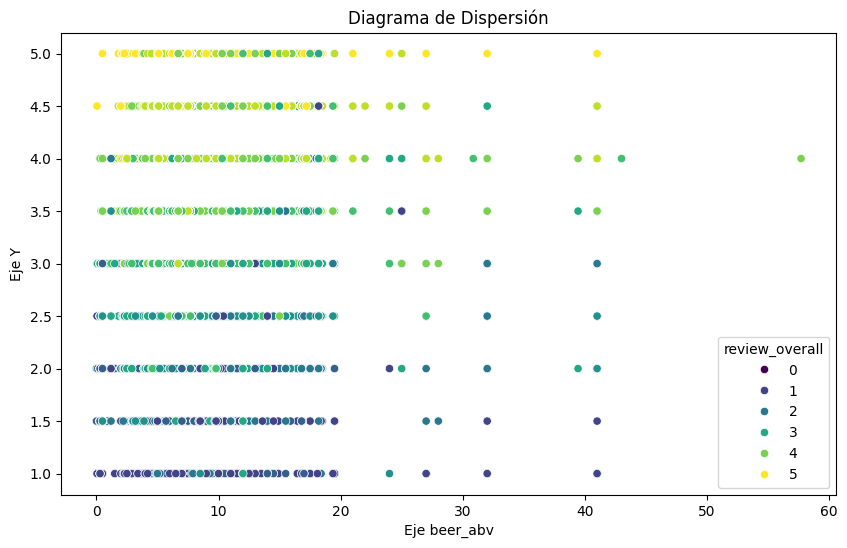

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='beer_abv', y='review_palate', hue='review_overall', palette='viridis')
plt.title('Diagrama de Dispersión')
plt.xlabel('Eje beer_abv')
plt.ylabel('Eje Y')
plt.show()

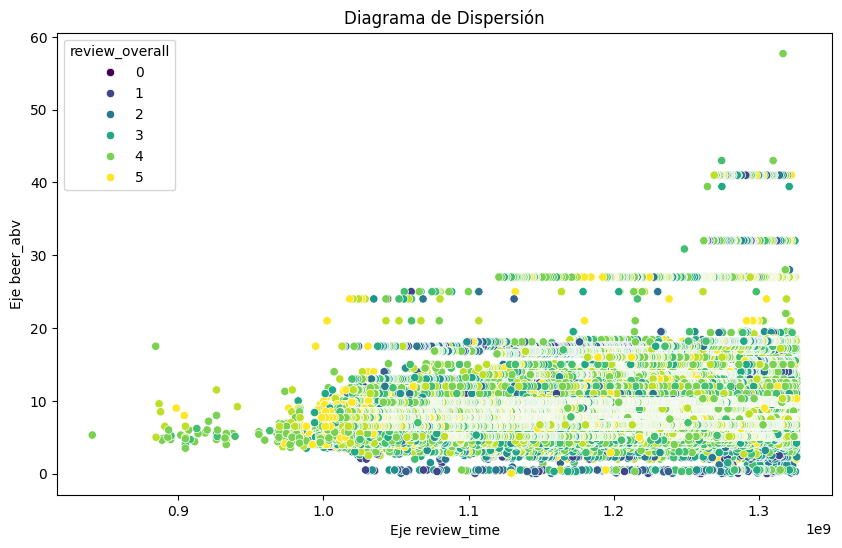

In [ ]:
#Gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='review_time', y='beer_abv', hue='review_overall', palette='viridis')
plt.title('Diagrama de Dispersión')
plt.xlabel('Eje review_time')
plt.ylabel('Eje beer_abv')
plt.show()

In [ ]:
#Gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='review_appearance', y='review_palate', hue='review_overall', palette='viridis')
plt.title('Diagrama de Dispersión')
plt.xlabel('Eje review_time')
plt.ylabel('Eje beer_abv')
plt.show()

# Curva ROC

-Español
 Un AUC de 0,89 en una curva ROC señala un rendimiento excepcional del modelo en la clasificación binaria. Esto implica que el modelo es efectivo para diferenciar entre las clases, sobrepasando la habilidad aleatoria de discriminación. Por lo general, un AUC tan elevado indica una gran exactitud en las predicciones.

-Ingles
 An AUC of 0.89 on a ROC curve signals exceptional model performance in binary classification. This implies that the model is effective in differentiating between classes, surpassing random discrimination ability. Generally, such a high AUC indicates high prediction accuracy.

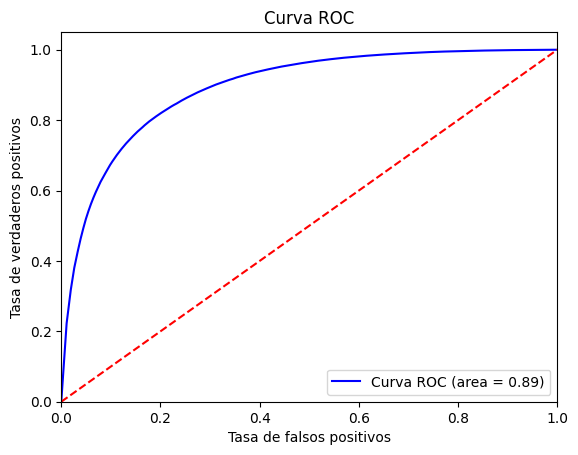

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Convertir 'review_overall' a binario
threshold = 4
df['binary_review'] = (df['review_overall'] >= threshold).astype(int)

# Definir las características y la variable objetivo
X = df[['brewery_id', 'review_time', 'review_aroma', 'review_appearance', 'review_palate', 'review_taste', 'beer_abv']]
y = df['binary_review']  # Usar la nueva variable binaria como objetivo

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Entrenar un clasificador
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Predecir probabilidades
y_scores = model.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva

# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

# Graficar la curva ROC
plt.figure()
plt.plot(fpr, tpr, color='blue', label='Curva ROC (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.show()

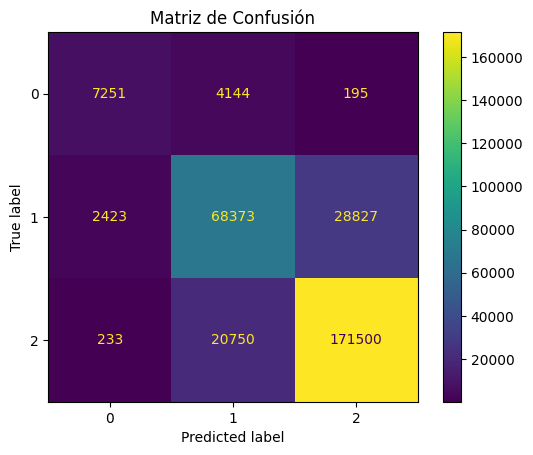

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.preprocessing import KBinsDiscretizer

n_bins = 3  # Puedes ajustar el número de categorías según necesites
discretizer = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='uniform')
y = discretizer.fit_transform(df[['review_overall']]).astype(int).ravel()

# Seleccionar características
X = df[['review_aroma', 'review_palate', 'review_taste', 'beer_abv']]

# Divide los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Mostrar la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Matriz de Confusión")
plt.show()

# Arbol de desicion

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn import tree

In [ ]:
X = df[['beer_abv', 'review_palate']]
y = df['review_overall']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=250)

In [ ]:
from sklearn.tree import DecisionTreeRegressor

# Usar DecisionTreeRegressor
regressor = DecisionTreeRegressor()
regressor.fit(X_train, y_train)

# Realiza predicciones
y_pred = regressor.predict(X_test)

# Evaluación (por ejemplo, usando el error cuadrático medio)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)
print('MSE:', mse)

MSE: 0.25676838494066123


In [ ]:
from sklearn.tree import DecisionTreeRegressor
#Si deseas predecir un valor continuo
# Cambiar a DecisionTreeRegressor
regressor = DecisionTreeRegressor()
regressor.fit(X_train, y_train)  # Donde y_train es continuo

DecisionTreeRegressor()

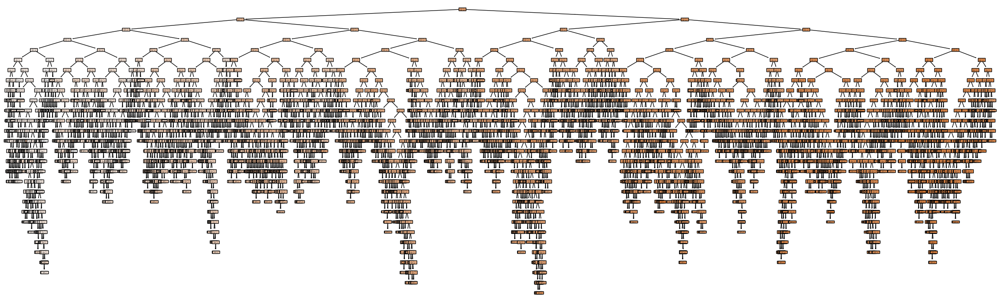

In [ ]:
plt.figure(figsize=(30, 9))
tree.plot_tree(regressor, filled=True)
plt.show()

# Arbol de desiciones 2: Review Overall

In [ ]:
# Crear categorías a partir de la calificación general
bins = [0, 2, 4, 5]  # Definir los cortes para cada categoría
labels = ['Baja', 'Media', 'Alta']
df['review_overall_cat'] = pd.cut(df['review_overall'], bins=bins, labels=labels, include_lowest=True)


In [ ]:
# Eliminar filas con valores nulos en la variable objetivo
df.dropna(subset=['review_overall_cat'], inplace=True)

# Definir las características (X) y la variable objetivo (y)
X = df.drop(['review_overall_cat', 'review_overall',  'beer_name', 'brewery_name'], axis=1)
y = df['review_overall_cat']

# One-Hot Encoding para variables categóricas restantes si es necesario
X = pd.get_dummies(X, drop_first=True)


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de clasificación
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Hacer predicciones y evaluar el modelo
y_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))


Accuracy: 0.7543766951988446
Reporte de clasificación:
               precision    recall  f1-score   support

        Alta       0.64      0.59      0.61      8512
        Baja       0.67      0.59      0.63       889
       Media       0.81      0.83      0.82     18988

    accuracy                           0.75     28389
   macro avg       0.70      0.67      0.69     28389
weighted avg       0.75      0.75      0.75     28389



This classification tree provides a useful analysis that could be applied in a market analysis context for the brewery to evaluate the quality of its beers based on various sensory characteristics and general attributes. From the accuracy of 75.4% and the analysis of the three beer quality categories ("High", "Medium", "Low"), we can draw the following key conclusions:


Product Segmentation by Quality:

  This model can help the brewery segment its products into different quality categories (High, Medium, Low), based on beer characteristics such as aroma, flavor, appearance, and alcohol level. This would allow the company to position its products appropriately in the market, aimed at different consumer profiles.

  By knowing the quality of beers and the characteristics that determine said quality, the marketing team could create campaigns specifically aimed at consumers who prefer "High" or "Medium" quality beers, adapting advertising strategies according to the preferences of the target audience. .

  Conclusion: This classification model has the potential to be a valuable tool in strategic decision making within the beer market. By segmenting products by quality and analyzing the key attributes that impact that classification, the brewery can identify opportunities for improvement, refine its product offering, and develop more effective marketing strategies.
  







ESPAÑOL:

Este árbol de clasificación proporciona un análisis útil que podría aplicarse en un contexto de análisis de mercado para la cervecería para que evalúe la calidad de sus cervezas en función de diversas características sensoriales y atributos generales. A partir de la precisión del 75.4% y el análisis de las tres categorías de calidad de la cerveza ("Alta", "Media", "Baja"), podemos extraer las siguientes conclusiones clave:


Segmentación de Productos por Calidad:

  Este modelo puede ayudar a la cervecería a segmentar sus productos en diferentes categorías de calidad (Alta, Media, Baja), basándose en las características de la cerveza como aroma, sabor, apariencia, y el nivel de alcohol. Esto permitiría a la empresa posicionar sus productos adecuadamente en el mercado, dirigidos a diferentes perfiles de consumidores.

  Al conocer la calidad de las cervezas y las características que determinan dicha calidad, el equipo de marketing podría crear campañas dirigidas específicamente a los consumidores que prefieren cervezas de "Alta" o "Media" calidad, adaptando las estrategias publicitarias según las preferencias del público objetivo.

  Conclusion: Este modelo de clasificación tiene el potencial de ser una herramienta valiosa en la toma de decisiones estratégicas dentro del mercado de la cerveza. Al segmentar productos por calidad y analizar los atributos clave que impactan esa clasificación, la cervecería puede identificar oportunidades de mejora, refinar su oferta de productos y desarrollar estrategias de marketing más efectivas.

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

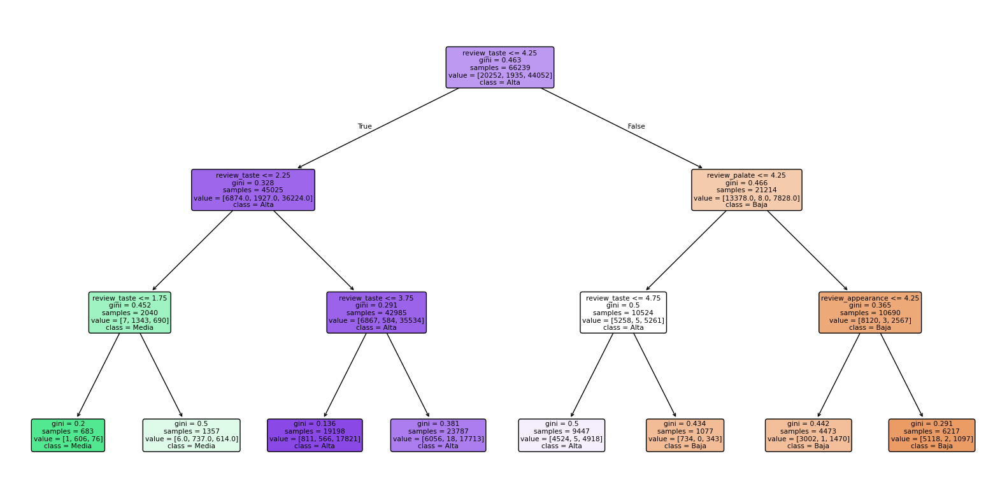

In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

clf = DecisionTreeClassifier(max_depth=3)  # Limita la profundidad
clf.fit(X_train, y_train)

# Visualizar el árbol de decisión
plt.figure(figsize=(20,10))  # Tamaño del gráfico
plot_tree(clf, filled=True, feature_names=X.columns, class_names=['Baja', 'Media', 'Alta'], rounded=True)
plt.show()


This decision tree can help make decisions based on selected attributes (such as review_taste and review_palate). For example, if a product has a taste rating less than or equal to 2.25, it is classified as "High." This can be helpful in understanding how product ratings are performing and where improvements can be made.





Este árbol de decisión puede ayudar a tomar decisiones basadas en los atributos seleccionados (como review_taste y review_palate). Por ejemplo, si un producto tiene una calificación de gusto menor o igual a 2.25, se clasifica como "Alta". Esto puede ser útil para entender cómo se comportan las calificaciones de los productos y dónde se pueden realizar mejoras.

In [ ]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(max_depth=None, min_samples_leaf=2, min_samples_split=10, random_state=42)
clf.fit(X_train, y_train)


DecisionTreeClassifier(min_samples_leaf=2, min_samples_split=10,
                       random_state=42)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Cargar los datos (asegúrate de cambiar la ruta si es necesario)
data = pd.read_csv('/content/sample_data/beer_reviews.csv')

# Crear categorías a partir de la calificación general
bins = [0, 2, 4, 5]  # Definir los cortes para cada categoría
labels = ['Baja', 'Media', 'Alta']
data['review_overall_cat'] = pd.cut(data['review_overall'], bins=bins, labels=labels, include_lowest=True)

# Eliminar filas con valores nulos en la variable objetivo
data.dropna(subset=['review_overall_cat'], inplace=True)

# Definir las características (X) y la variable objetivo (y)
X = data.drop(['review_overall_cat', 'review_overall', 'review_profilename', 'beer_name', 'beer_style', 'brewery_name'], axis=1)
y = data['review_overall_cat']

# One-Hot Encoding para variables categóricas restantes si es necesario
X = pd.get_dummies(X, drop_first=True)

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de clasificación
clf = DecisionTreeClassifier(max_depth=4, min_samples_leaf=2, random_state=42)  # Ajusta la profundidad y el mínimo de muestras
clf.fit(X_train, y_train)

# Hacer predicciones y evaluar el modelo
y_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))

# Visualizar el árbol de decisión
plt.figure(figsize=(150,90))  # Tamaño del gráfico
plot_tree(clf, filled=True, feature_names=X.columns, class_names=['Baja', 'Media', 'Alta'], rounded=True)
plt.show()


Accuracy: 0.790232885490089
Reporte de clasificación:
               precision    recall  f1-score   support

        Alta       0.76      0.41      0.54    124283
        Baja       0.80      0.55      0.66     18755
       Media       0.79      0.94      0.86    332947

    accuracy                           0.79    475985
   macro avg       0.79      0.64      0.68    475985
weighted avg       0.79      0.79      0.77    475985



Precision:

   High: 0.70
   Low: 0.76
   Average: 0.82
   Precision indicates the proportion of true positives among all positive predictions. The "Medium" category has the best accuracy, which is positive.

Recall:

   High: 0.53
   Low: 0.62
   Average: 0.90
   Recall measures the proportion of true positives out of the total number of real positive cases. The "Medium" category has a very high recall, while "High" is lower, which means that beers that are really "Medium" are being classified more "correctly", but some that are "High" are being missed. .

F1-Score:

  High: 0.61
  Low: 0.69
  Average: 0.86
  The F1-Score is the harmonic mean of precision and recall. The "Medium" category also stands out here, showing a good balance between precision and recall.

Accuracy:

  The overall accuracy is 0.80, which means 80% of the predictions are correct. This is a good result and shows that the model is working quite well.





ESPAÑOL:



Precisión:

   Alta: 0.70
   Baja: 0.76
   Media: 0.82
   La precisión indica la proporción de verdaderos positivos entre todos los predicciones positivas. La categoría "Media" tiene la mejor precisión, lo cual es positivo.

Recall:

   Alta: 0.53
   Baja: 0.62
   Media: 0.90
   El recall mide la proporción de verdaderos positivos sobre el total de casos reales positivos. La categoría "Media" tiene un recall muy alto, mientras que "Alta" es más baja, lo que significa que se está clasificando más "correctamente" las cervezas que son realmente "Media", pero se están perdiendo algunas que son "Alta".

F1-Score:

  Alta: 0.61
  Baja: 0.69
  Media: 0.86
  El F1-Score es la media armónica de precisión y recall. La categoría "Media" también destaca aquí, mostrando un buen equilibrio entre precisión y recall.

Exactitud (Accuracy):

  La precisión general es de 0.80, lo que significa que el 80% de las predicciones son correctas. Este es un buen resultado y muestra que el modelo está funcionando bastante bien.

# preguntas iniciales:

In [ ]:
df


,brewery_id,review_time,review_overall,review_aroma,review_appearance,review_palate,review_taste,beer_abv,beer_beerid
0,10325,1.234818e+09,-3.438073,-2.695559,-2.354764,-3.539804,-3.388700,-1.013139,47986.0
1,10325,1.235915e+09,-1.264599,-1.952210,-1.508684,-1.243704,-1.244187,-0.480154,48213.0
2,10325,1.235917e+09,-1.264599,-1.952210,-1.508684,-1.243704,-1.244187,-0.346908,48215.0
3,10325,1.234725e+09,-1.264599,-1.208862,-0.662603,-2.009070,-1.244187,-1.013139,47969.0
4,1075,1.293735e+09,0.184383,1.021184,0.183477,0.287030,0.900325,0.186077,64883.0
...,...,...,...,...,...,...,...,...,...
176899,3052,1.207019e+09,0.184383,0.277836,-0.662603,0.287030,0.185488,-1.634955,35153.0
176900,3052,1.206228e+09,1.633365,-0.465513,1.029558,-0.478337,-0.529350,-1.634955,35153.0
176901,3052,1.177193e+09,0.908874,-0.465513,-1.508684,-0.478337,-0.529350,-1.634955,35153.0
176902,3052,1.170833e+09,0.908874,0.277836,0.183477,0.287030,0.185488,-1.634955,35153.0


In [ ]:
# Agrupar por el tipo de cerveza (beer_beerid) y calcular el promedio de las evaluaciones
mejor_evaluadas = df.groupby('beer_beerid')['review_overall'].mean().sort_values(ascending=False).head(10)

print("Tipos de cerveza mejor evaluados:")
print(mejor_evaluadas)

Tipos de cerveza mejor evaluados:
beer_beerid
23793.0    1.633365
23795.0    1.633365
7874.0     1.633365
35261.0    1.633365
49954.0    1.633365
67283.0    1.633365
49941.0    1.633365
24636.0    1.633365
49583.0    1.633365
23568.0    1.633365
Name: review_overall, dtype: float64


In [ ]:
# Agrupar por el tipo de cerveza (beer_beerid) y calcular el promedio de las valoraciones de sabor
mejor_sabor = df.groupby('beer_beerid')['review_taste'].mean().sort_values(ascending=False).head(10)

print("Cervezas con mejor sabor valorado:")
print(mejor_sabor)


Cervezas con mejor sabor valorado:
beer_beerid
16419.0    1.615163
39431.0    1.615163
36039.0    1.615163
2071.0     1.615163
32811.0    1.615163
29423.0    1.615163
37386.0    1.615163
65636.0    1.615163
12413.0    1.615163
28448.0    1.615163
Name: review_taste, dtype: float64


In [ ]:
mas_reviews = df['beer_beerid'].value_counts().head(10)

print("Cervezas con más reviews:")
print(mas_reviews)

Cervezas con más reviews:
beer_beerid
1904.0     2999
276.0      2587
11757.0    2501
2671.0     2491
30420.0    2029
2751.0     1971
19960.0    1930
3158.0     1912
16074.0    1405
5441.0     1394
Name: count, dtype: int64


# Modelo de regresion lineal


**normaliza los datos para el entrenamiento**


In [ ]:
!pip install imblearn
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Identify non-numeric columns
non_numeric_cols = df.select_dtypes(exclude=['number']).columns

# Drop or encode non-numeric columns
# Here, we're dropping for simplicity. You might want to encode them instead.
df = df.drop(columns=non_numeric_cols)

# Separar las características (X) de la variable objetivo (y)
X = df.drop('review_overall', axis=1)  # Suponiendo que 'review_overall' es la variable objetivo
y = df['review_overall']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Seleccionar las características (X) de la variable objetivo (y)
X = df.drop('review_overall', axis=1)
y = df['review_overall']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


El código prepara los datos para ser usados en un modelo. Primero, elimina las columnas que no son números. Luego, separa los datos en dos partes: una con las características que se usarán para predecir, y otra con el resultado que se quiere predecir (review_overall). Divide los datos en entrenamiento (80%) y prueba (20%), y normaliza los datos para que todas las características estén en la misma escala. Hay algunas partes repetidas que podrían simplificarse

Modelo =


Rendimiento cuadrático medio (MSE): 0.3771648356446432
Rendimiento de R^2: 0.6228351643553567


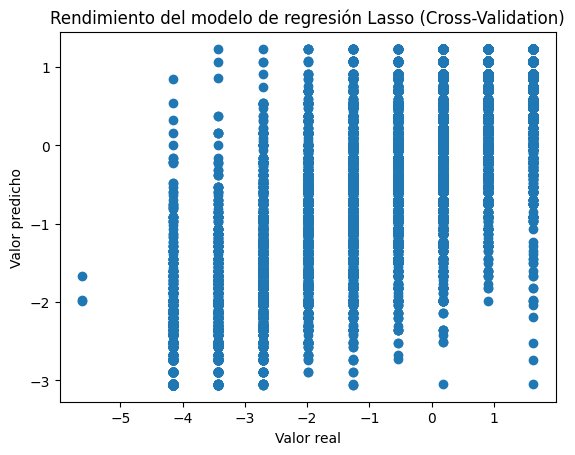

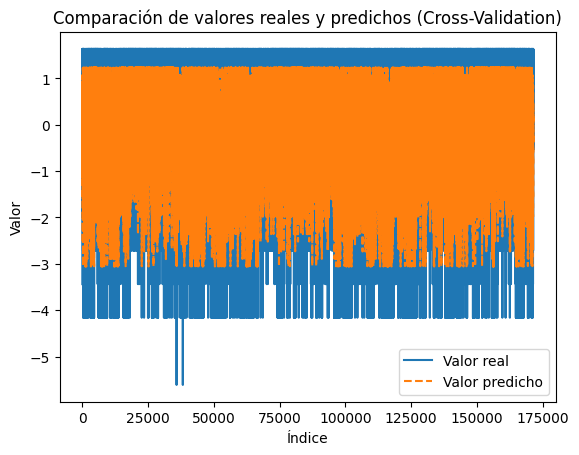

In [ ]:
# Importar librerías necesarias
import pandas as pd
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline

# Separar las características (X) de la variable objetivo (y)
X = df.drop('review_overall', axis=1)
y = df['review_overall']

# Definir el modelo de regresión Lasso con regularización
alpha = 0.1  # Parámetro de regularización, ajustable
model = make_pipeline(StandardScaler(), Lasso(alpha=alpha))

# Definir K-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Hacer predicciones con cross-validation
y_pred = cross_val_predict(model, X, y, cv=kf)

# Evaluar el modelo usando MSE y R²
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("Rendimiento cuadrático medio (MSE):", mse)
print("Rendimiento de R^2:", r2)

# Graficar el rendimiento del modelo
plt.scatter(y, y_pred)
plt.xlabel('Valor real')
plt.ylabel('Valor predicho')
plt.title('Rendimiento del modelo de regresión Lasso (Cross-Validation)')
plt.show()

plt.plot(y.values, label='Valor real')
plt.plot(y_pred, label='Valor predicho', linestyle='--')
plt.xlabel('Índice')
plt.ylabel('Valor')
plt.title('Comparación de valores reales y predichos (Cross-Validation)')
plt.legend()
plt.show()



El código implementa un modelo de regresión Lasso para predecir las calificaciones de cervezas (review_overall) a partir de otras características. Se separan los datos en características (X) y la variable objetivo (y), utilizando un modelo de regresión Lasso que incluye regularización para evitar el overfitting, penalizando coeficientes grandes. Se emplea un pipeline para normalizar los datos y aplicar el modelo de forma eficiente, y se implementa K-fold cross-validation para evaluar el modelo en diferentes subconjuntos de datos.

Los resultados muestran un error cuadrático medio (MSE) de 0.3772, lo que indica un error promedio relativamente bajo en las predicciones, aunque no perfecto. El coeficiente de determinación (R²) es de 0.6228, lo que significa que el modelo explica aproximadamente el 62.28% de la variabilidad en las calificaciones de las cervezas, dejando un 37.72% de variabilidad no explicada, sugiriendo que podrían ser relevantes otras características. En conclusión, el modelo tiene un rendimiento aceptable, pero hay oportunidades para mejorarlo.

# Modelo regresión polinomica

Modelo 1

Rendimiento cuadrático medio (MSE): 0.35454966847515185
Rendimiento de R^2: 0.6454503315248481


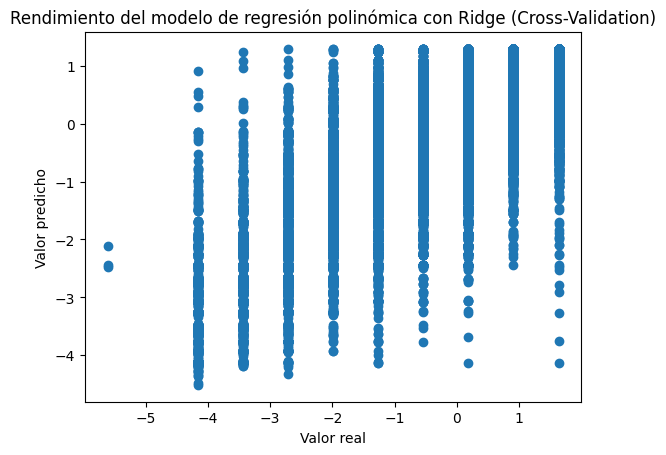

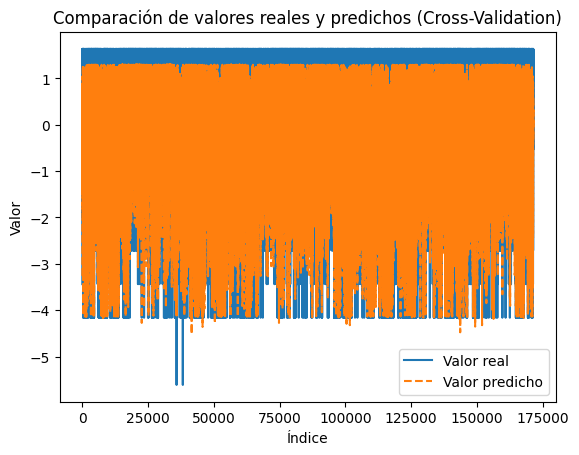

In [ ]:
# Importar librerías necesarias para el modelo
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Ridge  # Regularización para evitar overfitting
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline

# Seleccionar características para el modelo
X = df[['review_aroma', 'review_palate', 'review_taste']]
y = df['review_overall']

# Crear un pipeline con normalización, características polinómicas y Ridge (regularización)
degree = 2  # Grado del polinomio
poly_pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(degree=degree), Ridge(alpha=1.0))  # Ridge regularización

# Definir K-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Hacer predicciones con cross-validation
y_pred_poly = cross_val_predict(poly_pipeline, X, y, cv=kf)

# Evaluar el modelo usando MSE y R²
mse = mean_squared_error(y, y_pred_poly)
r2 = r2_score(y, y_pred_poly)

print("Rendimiento cuadrático medio (MSE):", mse)
print("Rendimiento de R^2:", r2)

# Graficar el rendimiento del modelo
plt.scatter(y, y_pred_poly)
plt.xlabel('Valor real')
plt.ylabel('Valor predicho')
plt.title('Rendimiento del modelo de regresión polinómica con Ridge (Cross-Validation)')
plt.show()

# Graficar la comparación de valores reales y predichos
plt.plot(y.values, label='Valor real')
plt.plot(y_pred_poly, label='Valor predicho', linestyle='--')
plt.xlabel('Índice')
plt.ylabel('Valor')
plt.title('Comparación de valores reales y predichos (Cross-Validation)')
plt.legend()
plt.show()


El código implementa un modelo de regresión utilizando Ridge para predecir las calificaciones generales de las cervezas (review_overall) basándose en tres características: review_aroma, review_palate y review_taste. Se crea un pipeline que normaliza los datos, genera características polinómicas de grado 2 y aplica la regresión Ridge, que ayuda a evitar el overfitting. Se utiliza K-fold cross-validation con 5 divisiones para evaluar el modelo en diferentes subconjuntos de datos.

Los resultados indican un rendimiento cuadrático medio (MSE) de 0.3545, lo que sugiere un error promedio bajo en las predicciones, y un coeficiente de determinación (R²) de 0.6455, lo que significa que el modelo explica aproximadamente el 64.55% de la variabilidad en las calificaciones de las cervezas. En resumen, el modelo tiene un buen ajuste, aunque hay margen de mejora al considerar más características o ajustar los hiperparámetros.

Modelo 2




Rendimiento cuadrático medio (MSE): 0.7626536559180874
Rendimiento de R^2: 0.23734634408191246


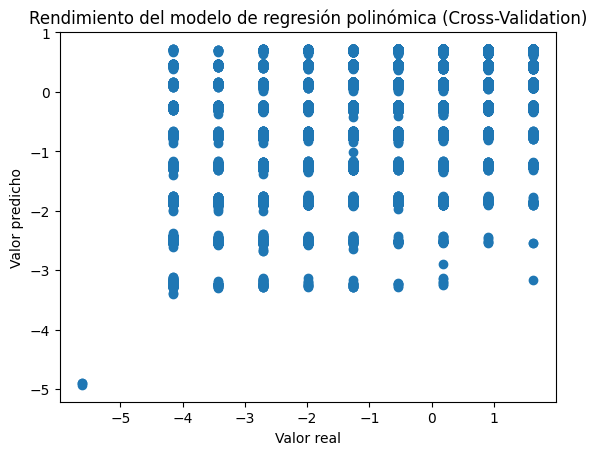

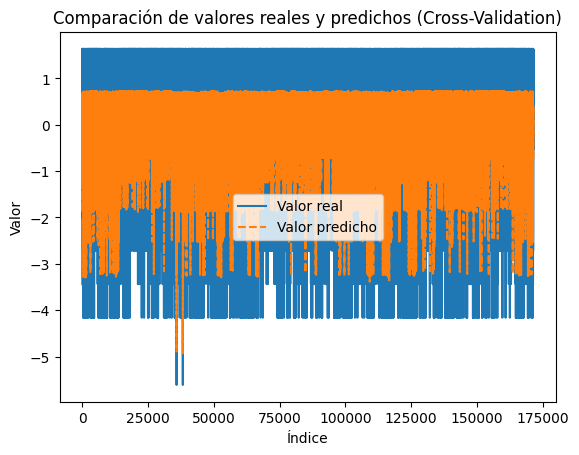

In [ ]:
# Importar librerías necesarias
import pandas as pd
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline

# Separar las características (X) de la variable objetivo (y)
X = df[['beer_abv', 'review_appearance']]
y = df['review_overall']

# Crear un pipeline con normalización, características polinómicas y regresión lineal
degree = 2  # Grado del polinomio
poly_pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(degree=degree), LinearRegression())

# Definir K-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Hacer predicciones con cross-validation
y_pred_poly = cross_val_predict(poly_pipeline, X, y, cv=kf)

# Evaluar el modelo usando MSE y R²
mse = mean_squared_error(y, y_pred_poly)
r2 = r2_score(y, y_pred_poly)

print("Rendimiento cuadrático medio (MSE):", mse)
print("Rendimiento de R^2:", r2)

# Graficar el rendimiento del modelo
plt.scatter(y, y_pred_poly)
plt.xlabel('Valor real')
plt.ylabel('Valor predicho')
plt.title('Rendimiento del modelo de regresión polinómica (Cross-Validation)')
plt.show()

# Graficar la comparación de valores reales y predichos
plt.plot(y.values, label='Valor real')
plt.plot(y_pred_poly, label='Valor predicho', linestyle='--')
plt.xlabel('Índice')
plt.ylabel('Valor')
plt.title('Comparación de valores reales y predichos (Cross-Validation)')
plt.legend(loc="center")
plt.show()


El código implementa un modelo de regresión polinómica para predecir las calificaciones generales de las cervezas (review_overall) utilizando el contenido de alcohol por volumen (beer_abv) y la apariencia de la cerveza (review_appearance). Se crea un pipeline que normaliza los datos, genera características polinómicas de grado 2 y aplica regresión lineal. Se utiliza validación cruzada K-fold con 5 divisiones para evaluar el rendimiento del modelo.

Los resultados muestran un rendimiento cuadrático medio (MSE) de 0.7627, indicando un error promedio alto en las predicciones, y un coeficiente de determinación (R²) de 0.2373, lo que significa que el modelo solo explica el 23.73% de la variabilidad en las calificaciones. Estos valores sugieren que el modelo no está ajustando bien a los datos, lo que implica que se necesitan más características o un enfoque diferente para mejorar el rendimiento.

Modelo 3

Rendimiento cuadrático medio (MSE): 0.7054757130436135
Rendimiento de R^2: 0.29452428695638655


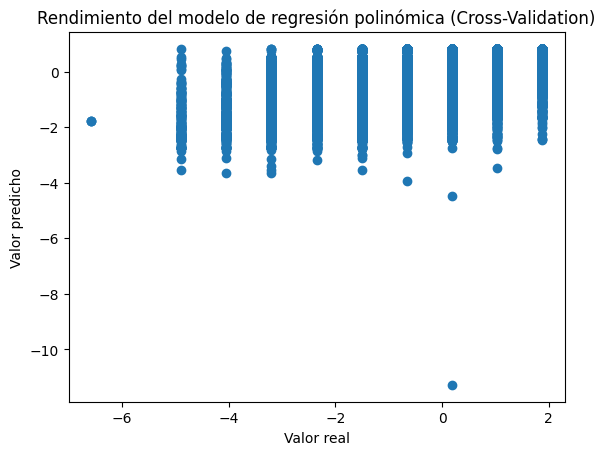

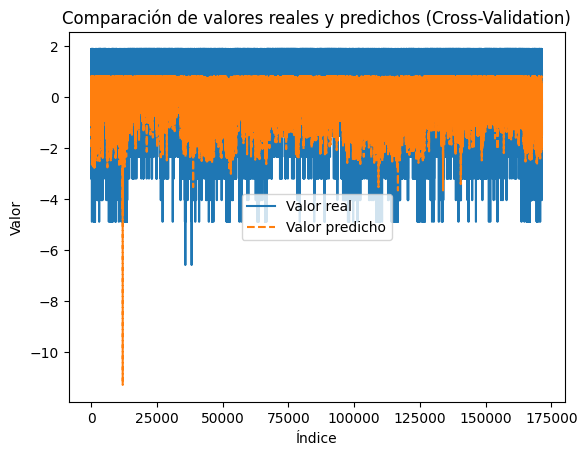

In [ ]:
# Importar librerías necesarias
import pandas as pd
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Ridge  # Usamos Ridge para regularización
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline

# Separar las características (X) de la variable objetivo (y)
X = df[['review_taste','beer_abv']]
y = df['review_appearance']

# Crear un pipeline con normalización, características polinómicas y Ridge (regularización)
degree = 2  # Grado del polinomio
poly_pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(degree=degree), Ridge(alpha=1.0))  # Ridge con alpha=1.0

# Definir K-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Hacer predicciones con cross-validation
y_pred_poly = cross_val_predict(poly_pipeline, X, y, cv=kf)

# Evaluar el modelo usando MSE y R²
mse = mean_squared_error(y, y_pred_poly)
r2 = r2_score(y, y_pred_poly)

print("Rendimiento cuadrático medio (MSE):", mse)
print("Rendimiento de R^2:", r2)

# Graficar el rendimiento del modelo
plt.scatter(y, y_pred_poly)
plt.xlabel('Valor real')
plt.ylabel('Valor predicho')
plt.title('Rendimiento del modelo de regresión polinómica (Cross-Validation)')
plt.show()

# Graficar la comparación de valores reales y predichos
plt.plot(y.values, label='Valor real')
plt.plot(y_pred_poly, label='Valor predicho', linestyle='--')
plt.xlabel('Índice')
plt.ylabel('Valor')
plt.title('Comparación de valores reales y predichos (Cross-Validation)')
plt.legend(loc="center")
plt.show()


El modelo de regresión polinómica con regularización Ridge para predice la apariencia de cervezas (review_appearance) utilizando dos características: el sabor de la cerveza (review_taste) y su contenido de alcohol (beer_abv). Primero, los datos se normalizan y se generan características polinómicas de grado 2 mediante un pipeline que combina estas transformaciones con el modelo Ridge, el cual ayuda a prevenir el sobreajuste (overfitting).

Se aplica K-fold cross-validation con 5 divisiones para obtener predicciones más robustas y evitar que los resultados se vean afectados por una sola división del conjunto de datos. Luego, se evalúa el rendimiento del modelo utilizando el error cuadrático medio (MSE) y el coeficiente de determinación (R²). En este caso, el MSE es 0.7055, lo que indica un error moderado en las predicciones, mientras que el R² es 0.2945, lo que sugiere que el modelo solo explica aproximadamente el 29.45% de la variabilidad en la apariencia de la cerveza. Esto indica que hay margen para mejorar el modelo, posiblemente considerando más variables o ajustando el enfoque. Las gráficas muestran cómo se comparan los valores reales y los predichos, reflejando la efectividad del modelo en su predicción.

# Arbol de decisión 3

In [ ]:
# Definir la calidad
def categorize_quality(value):
    if value <= 2:
        return 'Baja'
    elif 2 < value <= 4:
        return 'Media'
    else:
        return 'Alta'

# Crear una columna de calidad basada en review_appearance
df['beer_quality'] = df['review_appearance'].apply(categorize_quality)


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Seleccionar las características que quieres usar (puedes añadir más columnas si lo prefieres)
X = df[['review_overall', 'review_aroma', 'review_palate', 'review_taste', 'beer_abv']].fillna(0)
y = df['beer_quality']

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Crear el modelo de árbol de decisión
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)

# Predecir y evaluar
y_pred = tree_clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy: 0.7421044150821785
              precision    recall  f1-score   support

        Alta       0.52      0.37      0.44      8992
        Baja       0.29      0.27      0.28       652
       Media       0.80      0.87      0.83     27592

    accuracy                           0.74     37236
   macro avg       0.54      0.51      0.52     37236
weighted avg       0.72      0.74      0.73     37236



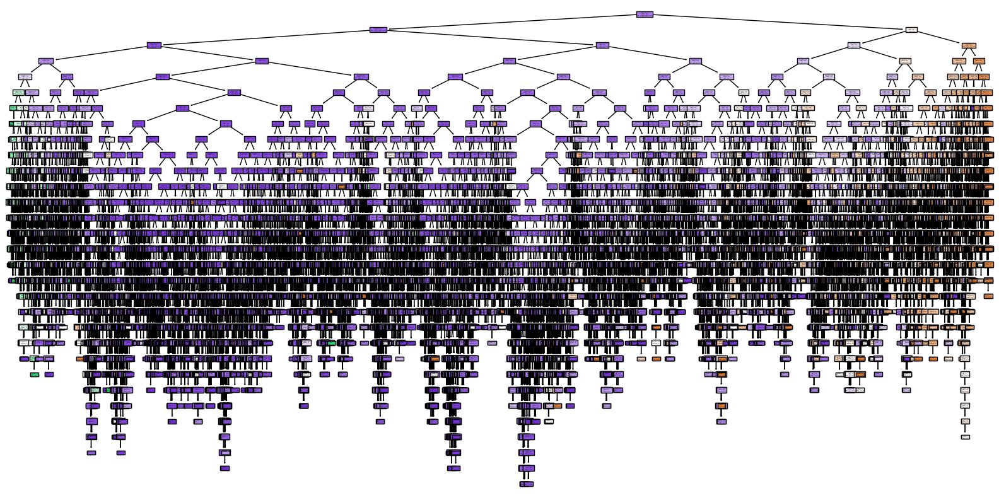

In [ ]:
from sklearn import tree
import matplotlib.pyplot as plt

# Visualizar el árbol
plt.figure(figsize=(20,10))
tree.plot_tree(tree_clf, filled=True, feature_names=X.columns, class_names=['Baja', 'Media', 'Alta'])
plt.show()


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Seleccionar las características
X = df[['review_overall', 'review_aroma', 'review_palate', 'review_taste', 'beer_abv']].fillna(0)
y = df['beer_quality']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Crear y ajustar el modelo de árbol de decisión con limitaciones para evitar sobreajuste
tree_clf = DecisionTreeClassifier(
    random_state=42,
    max_depth=10,  # Limitar la profundidad del árbol
    min_samples_split=10,  # Número mínimo de muestras necesarias para dividir un nodo
    min_samples_leaf=5,  # Número mínimo de muestras necesarias en una hoja
    class_weight='balanced'  # Ajustar peso para balancear las clases
)

tree_clf.fit(X_train, y_train)

# Predicciones y evaluación
y_pred = tree_clf.predict(X_test)
print("Accuracy ajustado:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy ajustado: 0.5818025566655924
              precision    recall  f1-score   support

        Alta       0.41      0.73      0.52      8992
        Baja       0.12      0.76      0.20       652
       Media       0.86      0.53      0.66     27592

    accuracy                           0.58     37236
   macro avg       0.46      0.67      0.46     37236
weighted avg       0.74      0.58      0.62     37236



Better performance in minority classes

   The "Low" class now has a recall of 76% (previously it was only 27%). This means that the model is doing a better job of identifying low-quality beers, although accuracy is still low (12%). This is typical in data sets.
    The "High" class also has a much better recall now (73% vs. 37% previously), meaning the model identifies many more high-quality beers.

Performance in the "Middle" class

  The model is less accurate for the "Medium" class now (accuracy dropped from 82% to 86%), but it is still quite strong. The f1-score for the middle class (0.66) is still acceptable, but lowered compared to the previous setting.





español:

Mejor rendimiento en clases minoritarias

   La clase "Baja" tiene ahora un recall del 76% (antes era solo del 27%). Esto significa que el modelo está haciendo un mejor trabajo identificando las cervezas de baja calidad, aunque la precisión sigue siendo baja (12%). Esto es típico en conjuntos de datos.
    La clase "Alta" también tiene un recall mucho mejor ahora (73% frente al 37% anterior), lo que significa que el modelo identifica muchas más cervezas de alta calidad.

Rendimiento en la clase "Media"

  El modelo es menos preciso para la clase "Media" ahora (precision bajó del 82% al 86%), pero sigue siendo bastante fuerte. El f1-score para la clase media (0.66) aún es aceptable, pero bajó en comparación con el ajuste anterior.


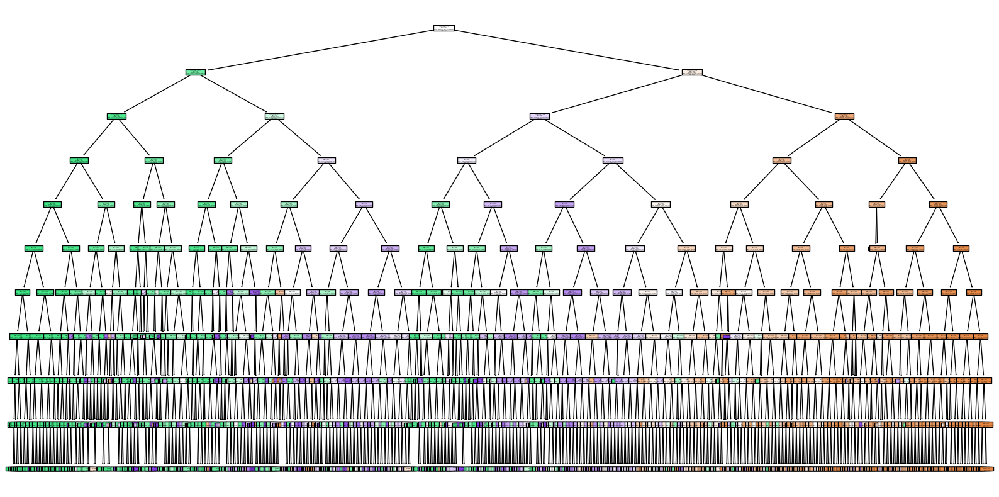

In [ ]:
from sklearn import tree
import matplotlib.pyplot as plt

# Visualizar el árbol ajustado
plt.figure(figsize=(20,10))
tree.plot_tree(tree_clf, filled=True, feature_names=X.columns, class_names=['Baja', 'Media', 'Alta'])
plt.show()


In [ ]:
import pandas as pd

# Cargar el archivo CSV
df = pd.read_csv('/content/sample_data/beer_reviews.csv')

# Verificar las primeras filas para asegurarte de que se cargó correctamente
df.head()


,brewery_id,brewery_name,review_time,review_overall,review_aroma,review_appearance,review_profilename,beer_style,review_palate,review_taste,beer_name,beer_abv,beer_beerid
0,10325,Vecchio Birraio,1234817823,1.5,2.0,2.5,stcules,Hefeweizen,1.5,1.5,Sausa Weizen,5.0,47986.0
1,10325,Vecchio Birraio,1235915097,3.0,2.5,3.0,stcules,English Strong Ale,3.0,3.0,Red Moon,6.2,48213.0
2,10325,Vecchio Birraio,1235916604,3.0,2.5,3.0,stcules,Foreign / Export Stout,3.0,3.0,Black Horse Black Beer,6.5,48215.0
3,10325,Vecchio Birraio,1234725145,3.0,3.0,3.5,stcules,German Pilsener,2.5,3.0,Sausa Pils,5.0,47969.0
4,1075,Caldera Brewing Company,1293735206,4.0,4.5,4.0,johnmichaelsen,American Double / Imperial IPA,4.0,4.5,Cauldron DIPA,7.7,64883.0


In [ ]:
import pandas as pd  # Importar pandas

# Cargar el archivo CSV (si no lo has hecho aún)
df = pd.read_csv('/content/sample_data/beer_reviews.csv')

# Definir las categorías de calidad basadas en 'review_appearance'
df['beer_quality'] = pd.cut(df['review_appearance'],
                            bins=[0, 2, 3.5, 5],  # Cambiar los umbrales si es necesario
                            labels=['Baja', 'Media', 'Alta'])

# Verificar las primeras filas para asegurarte de que la columna se creó correctamente
df[['review_appearance', 'beer_quality']].head()



,review_appearance,beer_quality
0,2.5,Media
1,3.0,Media
2,3.0,Media
3,3.5,Media
4,4.0,Alta


In [ ]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Cargar los datos
df = pd.read_csv('/content/sample_data/beer_reviews.csv')

# Crear la columna 'beer_quality' basada en 'review_appearance' (que será categórica)
df['beer_quality'] = pd.cut(df['review_appearance'],
                            bins=[0, 2, 3.5, 5],
                            labels=['Baja', 'Media', 'Alta'])

# Asegurarnos de que 'beer_quality' es categórica
df['beer_quality'] = df['beer_quality'].astype('category')

# Seleccionar las características (X) y la variable objetivo (y)
X = df[['review_overall', 'review_aroma', 'review_palate', 'review_taste', 'beer_abv']].fillna(0)
y = df['beer_quality']

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Normalizar los datos (X_train y X_test)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Verificar si hay valores nulos en y_train y y_test y rellenarlos si es necesario
y_train = y_train.fillna(y_train.mode()[0])
y_test = y_test.fillna(y_test.mode()[0])

# Aplicar SMOTE para balancear las clases en el conjunto de entrenamiento
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# Crear y ajustar el modelo de árbol de decisión con el conjunto balanceado
tree_clf = DecisionTreeClassifier(
    random_state=42,
    max_depth=10,
    min_samples_split=10,
    min_samples_leaf=5
)

# Entrenar el modelo
tree_clf.fit(X_train_smote, y_train_smote)

# Predicciones y evaluación
y_pred = tree_clf.predict(X_test_scaled)

# Asegurarnos de que y_pred y y_test sean tipo cadena
y_pred = pd.Series(y_pred).astype(str)
y_test = y_test.astype(str)

# Calcular la precisión y el reporte
print("Accuracy con SMOTE y datos normalizados:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy con SMOTE y datos normalizados: 0.6745989894639537
              precision    recall  f1-score   support

        Alta       0.84      0.71      0.77    308410
        Baja       0.23      0.77      0.36     10514
       Media       0.52      0.59      0.56    157061

    accuracy                           0.67    475985
   macro avg       0.53      0.69      0.56    475985
weighted avg       0.72      0.67      0.69    475985



 Precision:

   For the High class, the accuracy is 0.84, which means that when the model predicts "High", it is correct 84% of the time.
   For the Low class, the accuracy is only 0.23, indicating that there is a high false positive rate (predicting "Low" when it is not actually "Low").
   For the Medium class, the accuracy is 0.52, which also indicates moderate performance.

Recall:

   For the High class, the recall is 0.69, indicating that the model identifies 69% of all true instances of "High".
   For the Low class, the recall is 0.77, which means that the model correctly identifies 77% of the true instances of "Low", despite its low precision.
   For the Medium class, the recall is 0.61.


   1-Score: This is a weighted average of precision and recall, which provides a better measure of model performance in imbalanced classes.

   The F1-score for "High" is 0.76, which is pretty good.
   For "Low", it is 0.36, suggesting that the model is having difficulty correctly identifying this class.
   For "Medium", it is 0.56, which also indicates that there is room for improvement.

   conclusion:   

   Class imbalance: The precision and recall for the "Low" class are significantly worse than the other classes. This could indicate that your model is having trouble learning from this less represented class, even though using SMOTE helps balance the dataset.













Español:



Precision:

   Para la clase Alta, la precisión es 0.84, lo que significa que cuando el modelo predice "Alta", el 84% de las veces es correcto.
   Para la clase Baja, la precisión es solo 0.23, lo que indica que hay una alta tasa de falsos positivos (predice "Baja" cuando no es realmente "Baja").
   Para la clase Media, la precisión es 0.52, lo que también indica un rendimiento moderado.

Recall:

   Para la clase Alta, el recall es 0.69, lo que indica que el modelo identifica el 69% de todas las instancias verdaderas de "Alta".
   Para la clase Baja, el recall es 0.77, lo que significa que el modelo identifica correctamente el 77% de las instancias verdaderas de "Baja", a pesar de su baja precisión.
   Para la clase Media, el recall es 0.61.


   1-Score: Este es un promedio ponderado de precisión y recall, que proporciona una mejor medida del rendimiento del modelo en clases desequilibradas.

   La F1-score para "Alta" es 0.76, lo que es bastante bueno.
   Para "Baja", es 0.36, lo que sugiere que el modelo tiene dificultades para identificar correctamente esta clase.
   Para "Media", es 0.56, lo que también indica que hay margen de mejora.

   conclusion:   

   Desbalance de clases: La precisión y recall para la clase "Baja" son significativamente peores que las otras clases. Esto podría indicar que tu modelo tiene problemas para aprender de esta clase menos representada, a pesar de que el uso de SMOTE ayuda a balancear el dataset.

  

# Conclución


En esta parte del proyecto, empezamos a analizar de mejor manera los datos ya seleccionados anteriormente. Mediante diferentes métodos de análisis, descubrimos distintas informaciones que nos serán útiles para cuando ocupemos los datos de este CSV en las ventas reales con la cervecería Kross. El informe realizado analiza datos de cervezas caseras estadounidenses para ayudar a la cervecería Kross a identificar las mejores opciones para el mercado chileno. Las principales variables evaluadas fueron sabor, aroma, paladar y apariencia, que influyen directamente en las calificaciones de las cervezas. Estas características permiten clasificar las cervezas en categorías de alta, media y baja calidad, lo que ayudará a Kross a diferenciar sus productos en el mercado.
Los modelos realizados en esta segunda unidad tienen una aplicación directa en el mercado, ayudando a las empresas a comprender mejor los patrones de comportamiento de sus productos y consumidores.

Árboles de Clasificación: Utilizando los árboles de clasificación, aprendimos cómo segmentar productos en diferentes categorías de calidad, como en el caso del análisis de cervezas (Alta, Media, Baja). Esta segmentación permite a la empresa identificar qué productos cumplen con los estándares de alta calidad y cuáles podrían requerir mejoras. A nivel de mercado, esto apoya una estrategia de diferenciación, donde los productos se pueden orientar a diferentes segmentos de consumidores con precios o enfoques de marketing diferenciados.

árbol de decisión fue el más destacado por su capacidad para segmentar cervezas en diferentes categorías de calidad. Este modelo mostró una precisión del 84% al clasificar cervezas de alta calidad y mejoró significativamente el reconocimiento de las cervezas de calidad baja, algo que otros modelos no lograron con la misma efectividad. Sus métricas de precisión, recall y F1-Score permitieron identificar patrones clave en los datos, haciendo de este modelo una herramienta útil para Kross al definir qué productos lanzar y cómo mejorarlos.

Otro modelo relevante fue la regresión Lasso, que logró explicar el 62% de la variabilidad en las calificaciones de las cervezas. Este modelo evitó el sobreajuste y mantuvo un buen equilibrio entre simplicidad y precisión, siendo ideal para predecir las calificaciones generales de las cervezas. Su bajo error cuadrático medio (MSE) mostró que sus predicciones estaban cerca de los valores reales, lo que lo convierte en una herramienta confiable para comprender qué características afectan más la calidad percibida de las cervezas.

En resumen, estos modelos proporcionaron una base sólida para que Kross identifique las cervezas más prometedoras y aplique estrategias efectivas de marketing y desarrollo de productos en el mercado chileno.
